# 1. Texture-based Detectior

In [1]:
import cv2
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from skimage import io

def detect_fabric_defects_glcm(
    image_path,
    scale_factor=2,
    window_size=15,
    z_threshold=3.0,
    min_defect_area=50,
    visualize=True,
    device='cuda'  # Default to GPU
):
    """
    Fabric defect detection using GPU-accelerated GLCM Contrast features.
    Replaces slow CPU loops with PyTorch vectorization.
    """

    # ---------- 1. Load and Preprocess (CPU -> GPU) ----------
    img = io.imread(image_path)
    
    # Handle Grayscale/Color
    if img.ndim == 3:
        img_8bit = (img * 255).astype(np.uint8) if img.dtype == np.float64 else img
        gray_img = cv2.cvtColor(img_8bit, cv2.COLOR_BGR2GRAY)
    else:
        gray_img = img

    H, W = gray_img.shape
    # Downscale on CPU
    down_img = cv2.resize(
        gray_img, 
        (W // scale_factor, H // scale_factor), 
        interpolation=cv2.INTER_AREA
    ).astype(np.float32) / 255.0  # Normalize to 0-1 for stability

    # Move to GPU
    # If cuda is not available, fall back to cpu to prevent crashing
    if device == 'cuda' and not torch.cuda.is_available():
        print("Warning: CUDA not found. Falling back to CPU.")
        device = 'cpu'
        
    img_tensor = torch.tensor(down_img, device=device).unsqueeze(0).unsqueeze(0) # (B, C, H, W)

    # ---------- 2. Vectorized GLCM Contrast (The Fast Part) ----------
    # We calculate the Mean Squared Error between the image and its neighbors
    # This is mathematically equivalent to GLCM Contrast
    
    shifts = [
        (0, 1),   # 0 degrees
        (-1, 1),  # 45 degrees
        (-1, 0),  # 90 degrees
        (-1, -1)  # 135 degrees
    ]
    
    contrast_maps = []
    
    # Pad image once to handle boundaries for shifts
    pad = 1
    img_padded = F.pad(img_tensor, (pad, pad, pad, pad), mode='reflect')

    for dy, dx in shifts:
        # Extract original (centered) and neighbor (shifted) views
        src = img_padded[:, :, pad:pad+down_img.shape[0], pad:pad+down_img.shape[1]]
        
        y_start, y_end = pad + dy, pad + dy + down_img.shape[0]
        x_start, x_end = pad + dx, pad + dx + down_img.shape[1]
        neighbor = img_padded[:, :, y_start:y_end, x_start:x_end]
        
        # Squared difference
        sq_diff = (src - neighbor) ** 2
        
        # Average Pooling replaces the sliding window loop
        map_tensor = F.avg_pool2d(
            sq_diff, 
            kernel_size=window_size, 
            stride=1, 
            padding=window_size//2
        )
        contrast_maps.append(map_tensor)

    # Average the contrast across all 4 angles
    contrast_mean = torch.stack(contrast_maps).mean(dim=0)
    
    # Move result back to CPU
    contrast_map_cpu = contrast_mean.squeeze().cpu().numpy()

    # ---------- 3. Anomaly Detection (CPU) ----------
    mu = contrast_map_cpu.mean()
    std = contrast_map_cpu.std()
    z_map = (contrast_map_cpu - mu) / (std + 1e-6)
    
    anomaly_small = (z_map > z_threshold).astype(np.uint8) * 255
    
    # Morphological closing to fill holes in the defect mask
    kernel = np.ones((3, 3), np.uint8)
    anomaly_small = cv2.morphologyEx(anomaly_small, cv2.MORPH_CLOSE, kernel)
    
    # Resize mask back to original image size
    anomaly_mask = cv2.resize(
        anomaly_small, (W, H), interpolation=cv2.INTER_NEAREST
    )

    # ---------- 4. Extract Bounding Boxes ----------
    contours, _ = cv2.findContours(
        anomaly_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )

    boxes = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area >= min_defect_area:
            x, y, w, h = cv2.boundingRect(cnt)
            boxes.append((x, y, w, h))

    # ---------- 5. Visualization ----------
    if visualize:
        if img.ndim < 3:
            disp_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        else:
            disp_img = img.copy()

        for (x, y, w, h) in boxes:
            cv2.rectangle(disp_img, (x, y), (x + w, y + h), (255, 0, 0), 4)

        plt.figure(figsize=(12, 6))
        plt.subplot(1, 3, 1)
        plt.title("Original Image")
        plt.imshow(img, cmap='gray')
        plt.axis('off')
        
        plt.subplot(1, 3, 2)
        plt.title("GLCM Contrast (GPU)")
        plt.imshow(contrast_map_cpu, cmap='jet')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title("Detected Defects")
        plt.imshow(cv2.cvtColor(disp_img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

    return boxes

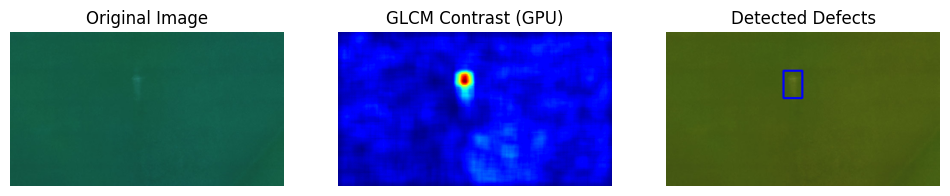

Detected boxes: [(274, 90, 44, 64)]


In [2]:
# --- Execution ---

boxes_glcm = detect_fabric_defects_glcm(
    image_path="/kaggle/input/fabric-defect-dataset/Data Set/hole/1.jpg",
    scale_factor=2,
    window_size=15,
    z_threshold=3.0,
    min_defect_area=50,
    visualize=True
)

print("Detected boxes:", boxes_glcm)

# 2. Frequency-based Detector 

In [3]:
import cv2
import numpy as np
import torch
import torch.fft
import matplotlib.pyplot as plt
from skimage import io, color

def detect_fabric_defects_fft(
    image_path,
    spectrum_threshold_factor=0.55,
    kernel_size=5,
    defect_threshold_factor=0.3,
    min_defect_area=500,
    visualize=True,
    device='cuda'
):
    """
    Fabric defect detection using GPU-accelerated FFT periodicity analysis.
    """

    # ---------- 1. Load and Preprocess (CPU -> GPU) ----------
    raw_img = io.imread(image_path)

    # Handle Grayscale/Color and Normalize
    if raw_img.ndim == 3:
        if raw_img.dtype != np.uint8 and np.max(raw_img) <= 1.0:
            gray_img = color.rgb2gray(raw_img)
        else:
            gray_img = cv2.cvtColor(raw_img, cv2.COLOR_RGB2GRAY)
        gray_img = gray_img.astype(np.float32) / 255.0
    else:
        gray_img = raw_img.astype(np.float32) / 255.0

    # Move to GPU
    # If cuda is not available, fall back to cpu to prevent crashing
    if device == 'cuda' and not torch.cuda.is_available():
        print("Warning: CUDA not found. Falling back to CPU.")
        device = 'cpu'

    img_tensor = torch.tensor(gray_img, device=device)

    # ---------- 2. Forward FFT (GPU) ----------
    # PyTorch fft2 expects complex input or real input, returns complex output
    f = torch.fft.fft2(img_tensor)
    fshift = torch.fft.fftshift(f)
    
    # Calculate Magnitude Spectrum
    # Log scale: 20 * log(|fshift| + epsilon)
    magnitude_spectrum = 20 * torch.log(torch.abs(fshift) + 1e-10)

    # ---------- 3. Periodic Peak Filtering ----------
    peak_threshold = torch.max(magnitude_spectrum) * spectrum_threshold_factor
    
    # Create mask on GPU
    mask_tensor = (magnitude_spectrum > peak_threshold).float()

    # Optimization Note:
    # Morphological operations (cv2.morphologyEx) are complex to replicate exactly on GPU 
    # without custom kernels. Since the mask is binary and "small" compared to FFT costs,
    # we do a quick CPU round-trip for the morphological step to maintain exact logic behavior.
    
    mask_cpu = mask_tensor.cpu().numpy().astype(np.uint8)
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    mask_cpu = cv2.morphologyEx(mask_cpu, cv2.MORPH_CLOSE, kernel)
    
    # Move mask back to GPU
    mask_tensor = torch.tensor(mask_cpu, device=device)

    # Apply mask in Frequency Domain
    fshift_filtered = fshift * mask_tensor

    # ---------- 4. Inverse FFT (GPU) ----------
    # Reconstruct the "regular" texture (background pattern)
    f_filtered = torch.fft.ifftshift(fshift_filtered)
    regular_texture = torch.abs(torch.fft.ifft2(f_filtered))

    # Normalize regular texture (min-max normalization)
    min_val = torch.min(regular_texture)
    max_val = torch.max(regular_texture)
    regular_norm = (regular_texture - min_val) / (max_val - min_val + 1e-6)

    # ---------- 5. Anomaly Detection (GPU -> CPU) ----------
    # Difference between original and reconstructed periodic pattern
    anomaly_map_tensor = torch.abs(img_tensor - regular_norm)
    
    defect_threshold = torch.max(anomaly_map_tensor) * defect_threshold_factor
    defect_mask_tensor = (anomaly_map_tensor > defect_threshold).float() * 255

    # Move final results to CPU for Contours and Visualization
    anomaly_map = anomaly_map_tensor.cpu().numpy()
    defect_mask = defect_mask_tensor.cpu().numpy().astype(np.uint8)
    magnitude_spectrum_cpu = magnitude_spectrum.cpu().numpy()

    # Final Morphological Cleanup (CPU)
    kernel_small = np.ones((5, 5), np.uint8)
    defect_mask = cv2.morphologyEx(defect_mask, cv2.MORPH_CLOSE, kernel_small)
    defect_mask = cv2.morphologyEx(defect_mask, cv2.MORPH_OPEN, kernel_small)

    # ---------- 6. Extract Bounding Boxes ----------
    contours, _ = cv2.findContours(
        defect_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )

    boxes = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area >= min_defect_area:
            x, y, w, h = cv2.boundingRect(cnt)
            boxes.append((x, y, w, h))

    # ---------- 7. Visualization ----------
    if visualize:
        if raw_img.ndim < 3:
            disp_img = cv2.cvtColor(raw_img, cv2.COLOR_GRAY2BGR)
        elif raw_img.shape[2] == 4:
            disp_img = cv2.cvtColor(raw_img, cv2.COLOR_RGBA2BGR)
        else:
            disp_img = raw_img.copy()

        for (x, y, w, h) in boxes:
            cv2.rectangle(
                disp_img, (x, y), (x + w, y + h), (255, 0, 0), 4
            )

        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title("FFT Spectrum (GPU)")
        plt.imshow(magnitude_spectrum_cpu, cmap="gray")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title("Anomaly Map")
        plt.imshow(anomaly_map, cmap="hot")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title("FFT Defect Detection")
        plt.imshow(cv2.cvtColor(disp_img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

    return boxes

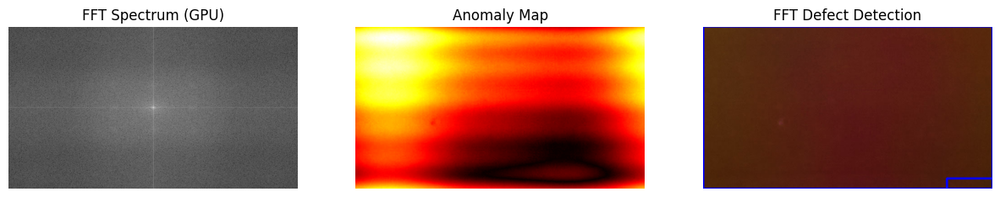

FFT boxes: [(539, 337, 101, 23), (0, 0, 640, 360)]


In [4]:
# --- Execution ---

boxes_fft = detect_fabric_defects_fft(
    image_path="/kaggle/input/fabric-defect-dataset/Data Set/hole/12.jpg",
    spectrum_threshold_factor=0.55,
    defect_threshold_factor=0.3,
    min_defect_area=500,
    visualize=True
)

print("FFT boxes:", boxes_fft)

# 3. Pattern Irregularity Detector

In [5]:
import cv2
import numpy as np
import torch
import torch.nn.functional as F
from skimage import io
import matplotlib.pyplot as plt

def detect_fabric_defects_hough(
    image_path,
    edge_threshold=0.5,     # Threshold for GPU Edge detection (0.0 to 1.0)
    blur_kernel_size=5,
    hough_threshold=100,
    min_line_length=50,
    max_line_gap=10,
    min_box_area=300,
    visualize=True,
    device='cuda'           # Use 'cuda' for T4 GPU
):
    """
    Fabric defect detection using GPU-accelerated Edge Detection + CPU Hough Transform.
    """

    # ---------- 1. Load and Preprocess (CPU -> GPU) ----------
    raw_img = io.imread(image_path)
    
    # Move to GPU and Normalize
    if raw_img.ndim == 3:
        # Convert to tensor (H, W, C)
        img_tensor = torch.tensor(raw_img, dtype=torch.float32, device=device)
        # Manual Grayscale conversion on GPU: 0.299R + 0.587G + 0.114B
        if raw_img.shape[2] == 3: # RGB
            gray_tensor = 0.299 * img_tensor[:,:,0] + 0.587 * img_tensor[:,:,1] + 0.114 * img_tensor[:,:,2]
        else: # RGBA
            gray_tensor = img_tensor[:,:,0] # Assume gray or just take first channel
    else:
        gray_tensor = torch.tensor(raw_img, dtype=torch.float32, device=device)

    # Add batch and channel dims: (1, 1, H, W)
    gray_tensor = gray_tensor.unsqueeze(0).unsqueeze(0) / 255.0

    # ---------- 2. GPU Edge Detection (Replaces Canny) ----------
    # Step A: Gaussian Blur (via Convolution)
    # Create a simple Gaussian kernel
    k_size = blur_kernel_size
    sigma = 1.0
    x_coord = torch.arange(k_size, device=device).float() - k_size // 2
    gaussian_1d = torch.exp(-(x_coord**2) / (2 * sigma**2))
    gaussian_1d = gaussian_1d / gaussian_1d.sum()
    # Create 2D kernel (outer product)
    gaussian_2d = gaussian_1d[:, None] @ gaussian_1d[None, :]
    gaussian_kernel = gaussian_2d.unsqueeze(0).unsqueeze(0)

    gray_blur = F.conv2d(gray_tensor, gaussian_kernel, padding=k_size//2)

    # Step B: Sobel Edge Detection (via Convolution)
    # Sobel kernels
    sobel_x = torch.tensor([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=torch.float32, device=device).view(1, 1, 3, 3)
    sobel_y = torch.tensor([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=torch.float32, device=device).view(1, 1, 3, 3)

    grad_x = F.conv2d(gray_blur, sobel_x, padding=1)
    grad_y = F.conv2d(gray_blur, sobel_y, padding=1)

    # Calculate Gradient Magnitude
    magnitude = torch.sqrt(grad_x**2 + grad_y**2)
    
    # Normalize magnitude to 0-1
    max_mag = magnitude.max()
    if max_mag > 0:
        magnitude /= max_mag

    # Threshold to create Binary Edge Map
    edges_tensor = (magnitude > edge_threshold).float()

    # Move Edge Map to CPU for Hough Transform (Hough is not standard in PyTorch)
    # (H, W) numpy array, uint8 0-255
    edges_cpu = (edges_tensor.squeeze().cpu().numpy() * 255).astype(np.uint8)

    # ---------- 3. Probabilistic Hough Transform (CPU) ----------
    # HoughLinesP is highly optimized in OpenCV C++ and hard to beat with custom Python/CUDA
    lines = cv2.HoughLinesP(
        edges_cpu,
        rho=1,
        theta=np.pi / 180,
        threshold=hough_threshold,
        minLineLength=min_line_length,
        maxLineGap=max_line_gap
    )

    # ---------- 4. Convert Lines to Bounding Boxes ----------
    boxes = []
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]

            x_min, y_min = min(x1, x2), min(y1, y2)
            x_max, y_max = max(x1, x2), max(y1, y2)
            
            w = x_max - x_min
            h = y_max - y_min

            # Filter small noise
            if w * h >= min_box_area:
                boxes.append((x_min, y_min, w, h))

    # ---------- 5. Visualization ----------
    if visualize:
        # Prepare display image
        if raw_img.ndim == 2:
             disp_img = cv2.cvtColor(raw_img, cv2.COLOR_GRAY2BGR)
        else:
             disp_img = raw_img.copy()

        # Draw boxes
        for (x, y, w, h) in boxes:
            cv2.rectangle(disp_img, (x, y), (x + w, y + h), (255, 0, 0), 4)

        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title("Original Image")
        if raw_img.ndim == 2:
            plt.imshow(raw_img, cmap='gray')
        else:
            plt.imshow(raw_img)
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title("GPU Edge Detection")
        plt.imshow(edges_cpu, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title(f"Hough Detections ({len(boxes)})")
        plt.imshow(disp_img)
        plt.axis('off')

        plt.show()

    return boxes

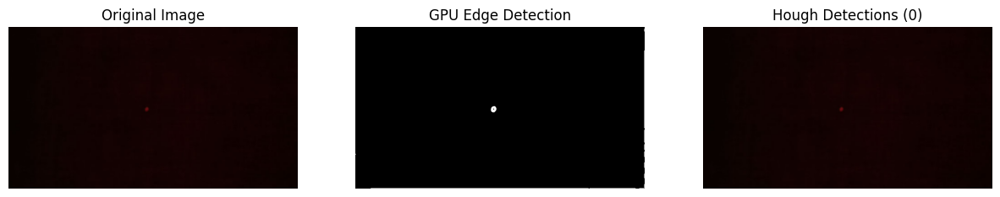

Hough boxes: []


In [6]:
# --- Execution ---

# Note: edge_threshold replaces canny_low/high. 
# 0.2 - 0.5 is usually good for detecting holes against fabric.
boxes_hough = detect_fabric_defects_hough(
    image_path="/kaggle/input/fabric-defect-dataset/Data Set/hole/16.jpg",
    edge_threshold=0.3,     # Adjusted for GPU Sobel magnitude
    hough_threshold=50,     # Lowered slightly as Sobel edges might be thicker
    min_line_length=30,
    visualize=True
)

print("Hough boxes:", boxes_hough)

# 4. Template matching based Detector

In [ ]:
import cv2
import numpy as np
import torch
import torch.nn.functional as F
from skimage import io
import matplotlib.pyplot as plt

def detect_fabric_defects_background(
    image_path,
    background_kernel_size=41,
    anomaly_threshold=0.04,
    morph_kernel_size=7,
    morph_iterations=2,
    min_defect_area=200,
    visualize=True,
    device='cuda'  # Use 'cuda' for T4 GPU
):
    """
    Fabric defect detection using GPU-accelerated Background Modeling (Smoothing) + Residuals.
    """

    # ---------- 1. Load and Preprocess (CPU -> GPU) ----------
    raw_img = io.imread(image_path)
    
    # Handle Grayscale/Color and Normalize
    if raw_img.ndim == 3:
        if raw_img.shape[2] == 4: # RGBA
            raw_img = cv2.cvtColor(raw_img, cv2.COLOR_RGBA2RGB)
        
        # Convert to tensor (H, W, C)
        img_tensor = torch.tensor(raw_img, dtype=torch.float32, device=device)
        # Manual Grayscale conversion on GPU
        gray_tensor = 0.299 * img_tensor[:,:,0] + 0.587 * img_tensor[:,:,1] + 0.114 * img_tensor[:,:,2]
    else:
        gray_tensor = torch.tensor(raw_img, dtype=torch.float32, device=device)

    # Normalize to 0-1 and add batch dim: (1, 1, H, W)
    gray_tensor = gray_tensor.unsqueeze(0).unsqueeze(0) / 255.0

    # ---------- 2. GPU Background Modeling ----------
    # Original used medianBlur (CPU slow). 
    # We use Average Pooling (GPU fast) to estimate the background texture.
    # It acts as a low-pass filter, removing high-freq defects to create a "clean" reference.
    
    # Ensure kernel size is odd
    if background_kernel_size % 2 == 0:
        background_kernel_size += 1
        
    # Apply smoothing on GPU
    background_model_tensor = F.avg_pool2d(
        gray_tensor, 
        kernel_size=background_kernel_size, 
        stride=1, 
        padding=background_kernel_size // 2
    )
    
    # Note: avg_pool2d slightly shrinks edges or requires padding handling. 
    # We use 'replicate' padding to avoid border artifacts before pooling if strict size is needed,
    # but PyTorch padding usually handles this well enough for defect detection context.

    # ---------- 3. Residual Anomaly Detection (GPU) ----------
    # Calculate absolute difference between Original and Background Model
    # Since avg_pool might have slightly different dimensions due to padding behavior in some setups,
    # we resize background model to match input exactly just in case (safe-guard).
    if background_model_tensor.shape != gray_tensor.shape:
        background_model_tensor = F.interpolate(background_model_tensor, size=gray_tensor.shape[2:], mode='bilinear')

    anomaly_map_tensor = torch.abs(gray_tensor - background_model_tensor)
    
    # Thresholding
    defect_mask_tensor = (anomaly_map_tensor > anomaly_threshold).float() * 255

    # Move to CPU for Morphological cleanup and Contours
    # (Morphology is cleaner/easier in OpenCV than raw PyTorch)
    defect_mask = defect_mask_tensor.squeeze().cpu().numpy().astype(np.uint8)
    anomaly_map_cpu = anomaly_map_tensor.squeeze().cpu().numpy()

    # ---------- 4. Morphological Cleanup (CPU) ----------
    kernel = np.ones((morph_kernel_size, morph_kernel_size), np.uint8)

    # Close gaps
    defect_mask = cv2.morphologyEx(
        defect_mask, cv2.MORPH_CLOSE, kernel, iterations=morph_iterations
    )
    # Remove noise
    defect_mask = cv2.morphologyEx(
        defect_mask, cv2.MORPH_OPEN, kernel
    )

    # ---------- 5. Extract Bounding Boxes ----------
    contours, _ = cv2.findContours(
        defect_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )

    boxes = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area >= min_defect_area:
            x, y, w, h = cv2.boundingRect(cnt)
            boxes.append((x, y, w, h))

    # ---------- 6. Visualization ----------
    if visualize:
        if raw_img.ndim < 3:
            disp_img = cv2.cvtColor(raw_img, cv2.COLOR_GRAY2BGR)
        else:
            disp_img = raw_img.copy()

        for (x, y, w, h) in boxes:
            cv2.rectangle(
                disp_img, (x, y), (x + w, y + h), (255, 0, 0), 4
            )

        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title("Original (GPU Processed)")
        if raw_img.ndim == 2:
            plt.imshow(raw_img, cmap='gray')
        else:
            plt.imshow(raw_img)
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title("Anomaly Map (Residual)")
        plt.imshow(anomaly_map_cpu, cmap="hot")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title("Background Subtraction Detection")
        plt.imshow(cv2.cvtColor(disp_img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

    return boxes

In [ ]:
# --- Execution ---

boxes_bg = detect_fabric_defects_background(
    image_path="/kaggle/input/fabric-defect-dataset/Data Set/hole/15.jpg",
    background_kernel_size=41,
    anomaly_threshold=0.04,
    min_defect_area=200,
    visualize=True
)

print("Background boxes:", boxes_bg)

# 5. Statistical model based Detector

In [7]:
import cv2
import numpy as np
import torch
import torch.nn.functional as F
from skimage import io
import matplotlib.pyplot as plt

def detect_fabric_defects_statistical(
    image_path,
    window_size=25,
    z_threshold=3.0,
    morph_kernel_size=7,
    morph_iterations=2,
    min_defect_area=500,
    visualize=True,
    device='cuda'  # Use 'cuda' for T4 GPU
):
    """
    Fabric defect detection using GPU-accelerated Statistical Texture Modeling
    (Local Standard Deviation via Box Filters + Z-score thresholding).
    """

    # ---------- 1. Load and Preprocess (CPU -> GPU) ----------
    raw_img = io.imread(image_path)

    # Handle Grayscale/Color and Normalize
    if raw_img.ndim == 3:
        if raw_img.shape[2] == 4: # RGBA
            raw_img = cv2.cvtColor(raw_img, cv2.COLOR_RGBA2RGB)
        
        # Convert to tensor (H, W, C)
        img_tensor = torch.tensor(raw_img, dtype=torch.float32, device=device)
        # Manual Grayscale conversion on GPU
        gray_tensor = 0.299 * img_tensor[:,:,0] + 0.587 * img_tensor[:,:,1] + 0.114 * img_tensor[:,:,2]
    else:
        gray_tensor = torch.tensor(raw_img, dtype=torch.float32, device=device)

    # Normalize to 0-1 and add batch/channel dim: (1, 1, H, W)
    gray_tensor = gray_tensor.unsqueeze(0).unsqueeze(0) / 255.0

    # ---------- 2. GPU Local Standard Deviation Map ----------
    # The Math Trick: StdDev = sqrt( E[X^2] - (E[X])^2 )
    # We use AvgPool2d to calculate the local Expectation E[...] efficiently.

    # 1. Calculate E[X] (Local Mean)
    # Use reflection padding to match scipy's behavior
    pad = window_size // 2
    gray_padded = F.pad(gray_tensor, (pad, pad, pad, pad), mode='reflect')
    
    mean_map = F.avg_pool2d(
        gray_padded, 
        kernel_size=window_size, 
        stride=1
    )

    # 2. Calculate E[X^2] (Local Mean of Squares)
    squared_padded = gray_padded ** 2
    mean_sq_map = F.avg_pool2d(
        squared_padded, 
        kernel_size=window_size, 
        stride=1
    )

    # 3. Calculate Variance = E[X^2] - (E[X])^2
    # Clamp to 0 to avoid negative values due to floating point errors
    var_map = torch.clamp(mean_sq_map - mean_map ** 2, min=0)
    
    # 4. Std Dev = Sqrt(Variance)
    std_map_tensor = torch.sqrt(var_map)

    # ---------- 3. Z-score Anomaly Detection (GPU) ----------
    # Global statistics of the local std_map
    mean_std = torch.mean(std_map_tensor)
    std_std = torch.std(std_map_tensor) + 1e-6
    
    z_score_map_tensor = (std_map_tensor - mean_std) / std_std
    
    defect_mask_tensor = (z_score_map_tensor > z_threshold).float() * 255

    # Move to CPU for Morphological cleanup and Contours
    defect_mask = defect_mask_tensor.squeeze().cpu().numpy().astype(np.uint8)
    z_score_map_cpu = z_score_map_tensor.squeeze().cpu().numpy()

    # ---------- 4. Morphological Cleanup (CPU) ----------
    kernel = np.ones((morph_kernel_size, morph_kernel_size), np.uint8)

    # Close gaps
    defect_mask = cv2.morphologyEx(
        defect_mask, cv2.MORPH_CLOSE, kernel, iterations=morph_iterations
    )
    # Remove noise
    defect_mask = cv2.morphologyEx(
        defect_mask, cv2.MORPH_OPEN, kernel
    )

    # ---------- 5. Extract Bounding Boxes ----------
    contours, _ = cv2.findContours(
        defect_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )

    boxes = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area >= min_defect_area:
            x, y, w, h = cv2.boundingRect(cnt)
            boxes.append((x, y, w, h))

    # ---------- 6. Visualization ----------
    if visualize:
        if raw_img.ndim < 3:
            disp_img = cv2.cvtColor(raw_img, cv2.COLOR_GRAY2BGR)
        else:
            disp_img = raw_img.copy()

        for (x, y, w, h) in boxes:
            cv2.rectangle(
                disp_img, (x, y), (x + w, y + h), (255, 0, 0), 4
            )

        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title("Grayscale Image")
        if raw_img.ndim == 2:
            plt.imshow(raw_img, cmap='gray')
        else:
            plt.imshow(raw_img)
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title(f"Z-Score Map (GPU)")
        plt.imshow(z_score_map_cpu, cmap="hot")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title("Statistical Defect Detection")
        plt.imshow(cv2.cvtColor(disp_img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

    return boxes

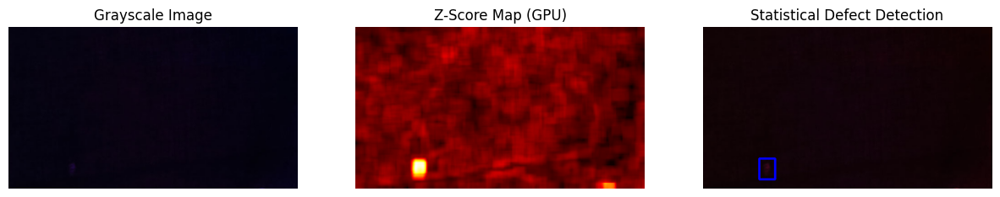

Statistical boxes: [(124, 293, 35, 46)]


In [8]:
# --- Execution ---

boxes_stat = detect_fabric_defects_statistical(
    image_path="/kaggle/input/fabric-defect-dataset/Data Set/hole/14.jpg",
    window_size=25,
    z_threshold=3.0,
    min_defect_area=500,
    visualize=True
)

print("Statistical boxes:", boxes_stat)

# 6. Gabor wavelets based Detector

In [13]:
import cv2
import numpy as np
import torch
import torch.nn.functional as F
from skimage import io
import matplotlib.pyplot as plt

def detect_fabric_defects_gabor(
    image_path,
    freqs=(0.1, 0.2),
    orientations=(0, np.pi/4, np.pi/2, 3*np.pi/4),
    gabor_kernel_size=(21, 21),
    gabor_sigma=4.0,
    gabor_gamma=0.5,
    energy_window_size=25,
    z_threshold=3.0,
    morph_kernel_size=7,
    morph_iterations=2,
    min_defect_area=500,
    visualize=True,
    device='cuda'
):
    """
    Fabric defect detection using GPU-accelerated Gabor wavelet texture analysis.
    optimized to handle border artifacts using reflection padding.
    """

    # ---------- 1. Load and preprocess ----------
    raw_img = io.imread(image_path)

    if raw_img.ndim == 3:
        if raw_img.shape[2] == 4:
            raw_img = cv2.cvtColor(raw_img, cv2.COLOR_RGBA2RGB)
        
        # Convert to tensor (H, W, C)
        img_tensor = torch.tensor(raw_img, dtype=torch.float32, device=device)
        # Manual Grayscale conversion on GPU to match cv2 behavior
        gray_tensor = 0.299 * img_tensor[:,:,0] + 0.587 * img_tensor[:,:,1] + 0.114 * img_tensor[:,:,2]
    else:
        gray_tensor = torch.tensor(raw_img, dtype=torch.float32, device=device)

    # Normalize and add batch/channel dims: (1, 1, H, W)
    gray_tensor = gray_tensor.unsqueeze(0).unsqueeze(0) / 255.0

    # ---------- 2. Create Gabor filter bank (CPU -> GPU) ----------
    gabor_kernels = []
    for theta in orientations:
        for freq in freqs:
            kernel = cv2.getGaborKernel(
                ksize=gabor_kernel_size,
                sigma=gabor_sigma,
                theta=theta,
                lambd=1.0 / freq,
                gamma=gabor_gamma,
                psi=0,
                ktype=cv2.CV_32F
            )
            gabor_kernels.append(kernel)

    # Stack into a single 4D tensor: (Out_Channels, 1, K_H, K_W)
    filters = np.stack(gabor_kernels)
    filters_tensor = torch.tensor(filters, dtype=torch.float32, device=device).unsqueeze(1)

    # ---------- 3. Compute Gabor responses (GPU) ----------
    # FIX: Add Reflection Padding manually before Conv2d to avoid black borders
    pad_h = gabor_kernel_size[0] // 2
    pad_w = gabor_kernel_size[1] // 2
    
    gray_padded = F.pad(gray_tensor, (pad_w, pad_w, pad_h, pad_h), mode='reflect')
    
    # Convolve (padding=0 because we already padded manually)
    responses = F.conv2d(gray_padded, filters_tensor, padding=0)
    
    # Calculate Texture Energy (Sum of Squared Responses)
    texture_energy_map_tensor = torch.sum(responses ** 2, dim=1, keepdim=True)

    # ---------- 4. Local variance of energy (GPU) ----------
    # Use E[X^2] - (E[X])^2 trick with Average Pooling
    
    # FIX: Add Reflection Padding for the energy window as well
    pad_energy = energy_window_size // 2
    energy_padded = F.pad(texture_energy_map_tensor, (pad_energy, pad_energy, pad_energy, pad_energy), mode='reflect')
    
    # Calculate Mean (E[X])
    mean_energy = F.avg_pool2d(energy_padded, kernel_size=energy_window_size, stride=1)
    
    # Calculate Mean of Squares (E[X^2])
    mean_sq_energy = F.avg_pool2d(energy_padded ** 2, kernel_size=energy_window_size, stride=1)
    
    # Variance = E[X^2] - (E[X])^2
    var_energy = torch.clamp(mean_sq_energy - mean_energy ** 2, min=0)
    std_energy_map_tensor = torch.sqrt(var_energy)

    # ---------- 5. Z-score anomaly detection ----------
    mean_std = torch.mean(std_energy_map_tensor)
    std_std = torch.std(std_energy_map_tensor) + 1e-6
    
    z_score_map_tensor = (std_energy_map_tensor - mean_std) / std_std
    
    # FIX: Zero out strict borders (Safety Margin) to prevent edge artifacts
    margin = 10
    z_score_map_tensor[:, :, :margin, :] = 0
    z_score_map_tensor[:, :, -margin:, :] = 0
    z_score_map_tensor[:, :, :, :margin] = 0
    z_score_map_tensor[:, :, :, -margin:] = 0

    defect_mask_tensor = (z_score_map_tensor > z_threshold).float() * 255

    # Download to CPU for morphology
    defect_mask = defect_mask_tensor.squeeze().cpu().numpy().astype(np.uint8)
    # Get intermediate maps for visualization
    texture_energy_map = texture_energy_map_tensor.squeeze().cpu().numpy()
    z_score_map = z_score_map_tensor.squeeze().cpu().numpy()

    # ---------- 6. Morphological cleanup ----------
    kernel = np.ones((morph_kernel_size, morph_kernel_size), np.uint8)

    defect_mask = cv2.morphologyEx(
        defect_mask, cv2.MORPH_CLOSE, kernel, iterations=morph_iterations
    )
    defect_mask = cv2.morphologyEx(
        defect_mask, cv2.MORPH_OPEN, kernel
    )

    # ---------- 7. Extract bounding boxes ----------
    contours, _ = cv2.findContours(
        defect_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )

    boxes = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area >= min_defect_area:
            x, y, w, h = cv2.boundingRect(cnt)
            boxes.append((x, y, w, h))

    # ---------- 8. Visualization ----------
    if visualize:
        if raw_img.ndim < 3:
            disp_img = cv2.cvtColor(raw_img, cv2.COLOR_GRAY2BGR)
        elif raw_img.shape[2] == 4:
            disp_img = cv2.cvtColor(raw_img, cv2.COLOR_RGBA2BGR)
        else:
            disp_img = raw_img.copy()

        for (x, y, w, h) in boxes:
            cv2.rectangle(
                disp_img, (x, y), (x + w, y + h), (255, 0, 0), 2
            )

        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title("Gabor Texture Energy Map")
        plt.imshow(texture_energy_map, cmap="gray")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title(f"Gabor Z-Score Map (> {z_threshold}σ)")
        plt.imshow(z_score_map, cmap="hot")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title("Gabor-Based Defect Detection")
        plt.imshow(cv2.cvtColor(disp_img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

    return boxes

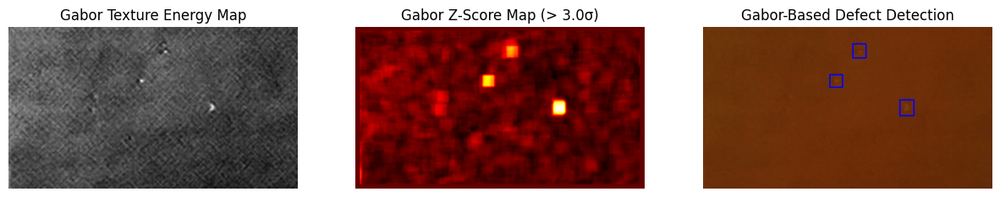

Gabor boxes: [(435, 163, 31, 35), (280, 107, 28, 28), (331, 39, 29, 31)]


In [14]:
# --- Execution ---

boxes_gabor = detect_fabric_defects_gabor(
    image_path="/kaggle/input/fabric-defect-dataset/Data Set/hole/13.jpg",
    z_threshold=3.0,
    min_defect_area=500,
    visualize=True
)

print("Gabor boxes:", boxes_gabor)

# 7. Classical Pipeline Architecture

## 7.1 Compute IoU

In [15]:
def compute_iou(box1, box2):
    """
    Computes Intersection over Union (IoU) for two boxes.
    box format: (x, y, w, h)
    """
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2  # Fixed typo here

    # Coordinates of the intersection box
    xa = max(x1, x2)
    ya = max(y1, y2)
    xb = min(x1 + w1, x2 + w2)
    yb = min(y1 + h1, y2 + h2)

    # Intersection area
    inter_w = max(0, xb - xa)
    inter_h = max(0, yb - ya)
    inter_area = inter_w * inter_h

    # Union area
    area1 = w1 * h1
    area2 = w2 * h2
    union_area = area1 + area2 - inter_area + 1e-6 # epsilon to avoid div by zero

    return inter_area / union_area

## 7.2. Merge overlapping boxes using IoU
This merges overlapping boxes from different detectors.

Logic: If IoU > threshold, merge boxes and Final box is the union of overlapping boxes

In [16]:
import torch
import numpy as np
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import connected_components

def merge_boxes_iou(boxes, iou_threshold=0.5):
    """
    Optimized merging using Connected Components.
    Finds clusters of overlapping boxes and merges them into a single bounding box.
    
    boxes: list of (x, y, w, h)
    returns: merged_boxes
    """
    if len(boxes) == 0:
        return []

    # 1. Convert to Tensor on GPU (N, 4)
    # Format: (x, y, w, h)
    boxes_tensor = torch.tensor(boxes, dtype=torch.float32).cuda()
    
    # Convert to (x1, y1, x2, y2) for IoU calculation
    b_x1 = boxes_tensor[:, 0]
    b_y1 = boxes_tensor[:, 1]
    b_x2 = boxes_tensor[:, 0] + boxes_tensor[:, 2]
    b_y2 = boxes_tensor[:, 1] + boxes_tensor[:, 3]

    # 2. Compute IoU Matrix (N x N) - Vectorized
    # This compares every box against every other box instantly
    
    # Broadcast to create matrices (N, N)
    inter_x1 = torch.max(b_x1.unsqueeze(1), b_x1.unsqueeze(0))
    inter_y1 = torch.max(b_y1.unsqueeze(1), b_y1.unsqueeze(0))
    inter_x2 = torch.min(b_x2.unsqueeze(1), b_x2.unsqueeze(0))
    inter_y2 = torch.min(b_y2.unsqueeze(1), b_y2.unsqueeze(0))

    inter_w = torch.clamp(inter_x2 - inter_x1, min=0)
    inter_h = torch.clamp(inter_y2 - inter_y1, min=0)
    inter_area = inter_w * inter_h

    area = boxes_tensor[:, 2] * boxes_tensor[:, 3]
    union_area = area.unsqueeze(1) + area.unsqueeze(0) - inter_area + 1e-6

    iou_matrix = inter_area / union_area

    # 3. Create Adjacency Matrix (Graph Edges)
    # If IoU > threshold, there is a "link" between the boxes
    adj_matrix = (iou_matrix > iou_threshold).cpu().numpy().astype(int)

    # 4. Find Connected Components
    # 'labels' is an array where `labels[i]` is the Group ID for box i
    n_components, labels = connected_components(
        csr_matrix(adj_matrix), directed=False
    )

    # 5. Merge Components
    merged_boxes = []
    
    # We can use numpy for the reduction (fast enough for N < 1000)
    boxes_np = np.array(boxes)
    x1_np = boxes_np[:, 0]
    y1_np = boxes_np[:, 1]
    x2_np = boxes_np[:, 0] + boxes_np[:, 2]
    y2_np = boxes_np[:, 1] + boxes_np[:, 3]

    for cluster_id in range(n_components):
        # Get indices of all boxes in this cluster
        indices = np.where(labels == cluster_id)[0]
        
        # Find min/max coordinates of the cluster
        min_x = np.min(x1_np[indices])
        min_y = np.min(y1_np[indices])
        max_x = np.max(x2_np[indices])
        max_y = np.max(y2_np[indices])
        
        w = max_x - min_x
        h = max_y - min_y
        
        merged_boxes.append((int(min_x), int(min_y), int(w), int(h)))

    return merged_boxes

## 7.3 Remove unrealistic large boxes

In [17]:
import torch
import numpy as np

def filter_boxes_by_size(boxes, image_shape, max_ratio=0.6):
    """
    Remove unrealistically large boxes using Vectorized Masking.
    """
    if len(boxes) == 0:
        return []

    H, W = image_shape[:2]

    # Convert to Tensor for vectorized comparison
    # boxes format: (N, 4) -> (x, y, w, h)
    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)

    w = boxes_tensor[:, 2]
    h = boxes_tensor[:, 3]

    # Create a boolean mask of valid boxes (No Loop)
    # Check both width and height ratios simultaneously
    mask = (w / W <= max_ratio) & (h / H <= max_ratio)

    # Apply mask to filter
    filtered_tensor = boxes_tensor[mask]

    # Convert back to list of tuples
    # .tolist() converts tensor -> list of lists, so we map to tuples
    return [tuple(map(int, b)) for b in filtered_tensor.tolist()]

## 7.4 Remove border artifacts

In [18]:
def filter_border_boxes(boxes, image_shape, margin=10):
    """
    Remove boxes touching the image border using Vectorized Masking.
    """
    if len(boxes) == 0:
        return []

    H, W = image_shape[:2]
    
    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)

    x = boxes_tensor[:, 0]
    y = boxes_tensor[:, 1]
    w = boxes_tensor[:, 2]
    h = boxes_tensor[:, 3]

    # Vectorized check for all boundaries at once
    # x_min > margin AND y_min > margin AND x_max < W-margin AND y_max < H-margin
    mask = (
        (x > margin) & 
        (y > margin) & 
        ((x + w) < (W - margin)) & 
        ((y + h) < (H - margin))
    )

    filtered_tensor = boxes_tensor[mask]

    return [tuple(map(int, b)) for b in filtered_tensor.tolist()]

# 8. Master Classical Detection Pipeline
This function:

* Runs all classical detectors
* Collects all boxes
* Merges them using IoU
* Returns final proposals

In [19]:
import cv2
import numpy as np

def run_all_classical_detectors(image_path):
    """
    Runs all detection methods and merges results using 
    GPU-optimized graph clustering and vectorized filtering.
    """
    # 1. Get Image Dimensions (Load once for metadata)
    # We need dimensions for the filters later
    meta_img = cv2.imread(image_path)
    if meta_img is None:
        raise ValueError(f"Could not load image at {image_path}")
    
    # 2. Run Detectors
    # We collect all candidate boxes into a single list
    boxes_all = []

    # --- GPU Optimized Methods (The ones we just wrote) ---
    # Note: Ensure visualize=False to save massive time
    boxes_all += detect_fabric_defects_gabor(image_path, visualize=False)
    boxes_all += detect_fabric_defects_background(image_path, visualize=False)
    boxes_all += detect_fabric_defects_statistical(image_path, visualize=False)

    # --- CPU Methods (Existing ones) ---
    # Assuming these functions exist in your environment
    if 'detect_fabric_defects_glcm' in globals():
        boxes_all += detect_fabric_defects_glcm(image_path, visualize=False)
    
    if 'detect_fabric_defects_fft' in globals():
        boxes_all += detect_fabric_defects_fft(image_path, visualize=False)
        
    if 'detect_fabric_defects_hough' in globals():
        boxes_all += detect_fabric_defects_hough(image_path, visualize=False)

    # 3. Step 1: Graph-Based IoU Merge (Fast)
    # Merges overlapping boxes from different detectors into unified defects
    merged_boxes = merge_boxes_iou(boxes_all, iou_threshold=0.5)

    # 4. Step 2: Vectorized Size Filtering
    # Removes boxes that are too big (false positives)
    merged_boxes = filter_boxes_by_size(
        merged_boxes, meta_img.shape, max_ratio=0.6
    )

    # 5. Step 3: Vectorized Border Filtering
    # Removes artifacts caused by padding/camera edges
    merged_boxes = filter_border_boxes(
        merged_boxes, meta_img.shape, margin=10
    )

    return merged_boxes

In [20]:
def visualize_final_boxes(image_path, boxes):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        print("Error loading image for visualization.")
        return
        
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    result_img = img_rgb.copy()

    for (x, y, w, h) in boxes:
        cv2.rectangle(result_img, (x, y), (x + w, y + h), (255, 0, 0), 4)

    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(img_rgb)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title(f"Final Detection ({len(boxes)} defects)")
    plt.imshow(result_img)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/16.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 2 raw candidates. Merging...
  -> Final Defect Count: 1


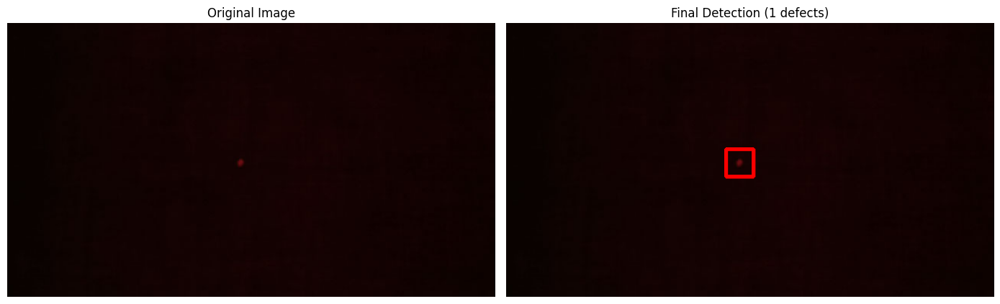

In [22]:
import cv2
import numpy as np
import torch
import torch.nn.functional as F
from skimage import io
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import connected_components

# ==========================================
# 1. GPU-Optimized Detectors
# ==========================================

def detect_fabric_defects_background(
    image_path,
    background_kernel_size=41,
    anomaly_threshold=0.04,
    morph_kernel_size=7,
    morph_iterations=2,
    min_defect_area=200,
    visualize=True,
    device='cuda' if torch.cuda.is_available() else 'cpu'
):
    """GPU-Accelerated Background Modeling using AvgPool."""
    raw_img = io.imread(image_path)
    
    # Preprocess
    if raw_img.ndim == 3:
        if raw_img.shape[2] == 4: raw_img = cv2.cvtColor(raw_img, cv2.COLOR_RGBA2RGB)
        img_tensor = torch.tensor(raw_img, dtype=torch.float32, device=device)
        gray_tensor = 0.299 * img_tensor[:,:,0] + 0.587 * img_tensor[:,:,1] + 0.114 * img_tensor[:,:,2]
    else:
        gray_tensor = torch.tensor(raw_img, dtype=torch.float32, device=device)
    
    gray_tensor = gray_tensor.unsqueeze(0).unsqueeze(0) / 255.0

    # Background Estimation (AvgPool)
    if background_kernel_size % 2 == 0: background_kernel_size += 1
    # Use reflection padding to avoid border issues
    pad = background_kernel_size // 2
    gray_padded = F.pad(gray_tensor, (pad, pad, pad, pad), mode='reflect')
    
    background_model = F.avg_pool2d(gray_padded, kernel_size=background_kernel_size, stride=1)
    
    # Residual
    anomaly_map = torch.abs(gray_tensor - background_model)
    defect_mask_tensor = (anomaly_map > anomaly_threshold).float() * 255
    
    # CPU Post-processing
    defect_mask = defect_mask_tensor.squeeze().cpu().numpy().astype(np.uint8)
    kernel = np.ones((morph_kernel_size, morph_kernel_size), np.uint8)
    defect_mask = cv2.morphologyEx(defect_mask, cv2.MORPH_CLOSE, kernel, iterations=morph_iterations)
    defect_mask = cv2.morphologyEx(defect_mask, cv2.MORPH_OPEN, kernel)
    
    contours, _ = cv2.findContours(defect_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    boxes = [cv2.boundingRect(c) for c in contours if cv2.contourArea(c) >= min_defect_area]
    
    return boxes

def detect_fabric_defects_statistical(
    image_path,
    window_size=25,
    z_threshold=3.0,
    morph_kernel_size=7,
    morph_iterations=2,
    min_defect_area=500,
    visualize=True,
    device='cuda' if torch.cuda.is_available() else 'cpu'
):
    """GPU-Accelerated Local Standard Deviation."""
    raw_img = io.imread(image_path)
    if raw_img.ndim == 3:
        if raw_img.shape[2] == 4: raw_img = cv2.cvtColor(raw_img, cv2.COLOR_RGBA2RGB)
        img_tensor = torch.tensor(raw_img, dtype=torch.float32, device=device)
        gray_tensor = 0.299 * img_tensor[:,:,0] + 0.587 * img_tensor[:,:,1] + 0.114 * img_tensor[:,:,2]
    else:
        gray_tensor = torch.tensor(raw_img, dtype=torch.float32, device=device)
        
    gray_tensor = gray_tensor.unsqueeze(0).unsqueeze(0) / 255.0

    # Local Std Dev using E[X^2] - (E[X])^2
    pad = window_size // 2
    gray_padded = F.pad(gray_tensor, (pad, pad, pad, pad), mode='reflect')
    
    mean_map = F.avg_pool2d(gray_padded, kernel_size=window_size, stride=1)
    mean_sq_map = F.avg_pool2d(gray_padded ** 2, kernel_size=window_size, stride=1)
    var_map = torch.clamp(mean_sq_map - mean_map ** 2, min=0)
    std_map = torch.sqrt(var_map)

    # Z-Score
    mean_std = torch.mean(std_map)
    std_std = torch.std(std_map) + 1e-6
    z_score = (std_map - mean_std) / std_std
    
    defect_mask_tensor = (z_score > z_threshold).float() * 255
    
    # CPU Post-processing
    defect_mask = defect_mask_tensor.squeeze().cpu().numpy().astype(np.uint8)
    kernel = np.ones((morph_kernel_size, morph_kernel_size), np.uint8)
    defect_mask = cv2.morphologyEx(defect_mask, cv2.MORPH_CLOSE, kernel, iterations=morph_iterations)
    defect_mask = cv2.morphologyEx(defect_mask, cv2.MORPH_OPEN, kernel)
    
    contours, _ = cv2.findContours(defect_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    boxes = [cv2.boundingRect(c) for c in contours if cv2.contourArea(c) >= min_defect_area]
    
    return boxes

def detect_fabric_defects_gabor(
    image_path,
    freqs=(0.1, 0.2),
    orientations=(0, np.pi/4, np.pi/2, 3*np.pi/4),
    gabor_kernel_size=(21, 21),
    gabor_sigma=4.0,
    gabor_gamma=0.5,
    energy_window_size=25,
    z_threshold=3.0,
    morph_kernel_size=7,
    morph_iterations=2,
    min_defect_area=500,
    visualize=True,
    device='cuda' if torch.cuda.is_available() else 'cpu'
):
    """GPU-Accelerated Gabor Filter with Reflection Padding."""
    raw_img = io.imread(image_path)
    if raw_img.ndim == 3:
        if raw_img.shape[2] == 4: raw_img = cv2.cvtColor(raw_img, cv2.COLOR_RGBA2RGB)
        img_tensor = torch.tensor(raw_img, dtype=torch.float32, device=device)
        gray_tensor = 0.299 * img_tensor[:,:,0] + 0.587 * img_tensor[:,:,1] + 0.114 * img_tensor[:,:,2]
    else:
        gray_tensor = torch.tensor(raw_img, dtype=torch.float32, device=device)
    
    gray_tensor = gray_tensor.unsqueeze(0).unsqueeze(0) / 255.0

    # Generate Kernels
    kernel_list = []
    for theta in orientations:
        for freq in freqs:
            k = cv2.getGaborKernel(gabor_kernel_size, gabor_sigma, theta, 1.0/freq, gabor_gamma, 0, ktype=cv2.CV_32F)
            kernel_list.append(k)
    filters = np.stack(kernel_list)
    filters_tensor = torch.tensor(filters, dtype=torch.float32, device=device).unsqueeze(1)

    # Gabor Response (Reflection Pad)
    pad_h, pad_w = gabor_kernel_size[0] // 2, gabor_kernel_size[1] // 2
    gray_padded = F.pad(gray_tensor, (pad_w, pad_w, pad_h, pad_h), mode='reflect')
    responses = F.conv2d(gray_padded, filters_tensor, padding=0)
    texture_energy = torch.sum(responses ** 2, dim=1, keepdim=True)

    # Local Variance (Reflection Pad)
    pad_e = energy_window_size // 2
    energy_padded = F.pad(texture_energy, (pad_e, pad_e, pad_e, pad_e), mode='reflect')
    mean_energy = F.avg_pool2d(energy_padded, kernel_size=energy_window_size, stride=1)
    mean_sq_energy = F.avg_pool2d(energy_padded ** 2, kernel_size=energy_window_size, stride=1)
    std_energy = torch.sqrt(torch.clamp(mean_sq_energy - mean_energy**2, min=0))

    # Z-Score & Safety Margin
    z_score = (std_energy - torch.mean(std_energy)) / (torch.std(std_energy) + 1e-6)
    margin = 10
    z_score[:, :, :margin, :] = 0; z_score[:, :, -margin:, :] = 0
    z_score[:, :, :, :margin] = 0; z_score[:, :, :, -margin:] = 0
    
    defect_mask_tensor = (z_score > z_threshold).float() * 255
    
    # CPU Post-processing
    defect_mask = defect_mask_tensor.squeeze().cpu().numpy().astype(np.uint8)
    kernel = np.ones((morph_kernel_size, morph_kernel_size), np.uint8)
    defect_mask = cv2.morphologyEx(defect_mask, cv2.MORPH_CLOSE, kernel, iterations=morph_iterations)
    defect_mask = cv2.morphologyEx(defect_mask, cv2.MORPH_OPEN, kernel)
    
    contours, _ = cv2.findContours(defect_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    boxes = [cv2.boundingRect(c) for c in contours if cv2.contourArea(c) >= min_defect_area]
    
    return boxes

# ==========================================
# 2. Optimized Merging & Filtering
# ==========================================

def merge_boxes_iou(boxes, iou_threshold=0.5):
    """Graph-based merging of overlapping boxes."""
    if len(boxes) == 0: return []
    
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    boxes_tensor = torch.tensor(boxes, dtype=torch.float32, device=device)
    
    # Vectorized IoU Matrix
    b_x1, b_y1 = boxes_tensor[:, 0], boxes_tensor[:, 1]
    b_x2, b_y2 = b_x1 + boxes_tensor[:, 2], b_y1 + boxes_tensor[:, 3]
    
    inter_x1 = torch.max(b_x1.unsqueeze(1), b_x1.unsqueeze(0))
    inter_y1 = torch.max(b_y1.unsqueeze(1), b_y1.unsqueeze(0))
    inter_x2 = torch.min(b_x2.unsqueeze(1), b_x2.unsqueeze(0))
    inter_y2 = torch.min(b_y2.unsqueeze(1), b_y2.unsqueeze(0))
    
    inter_area = torch.clamp(inter_x2 - inter_x1, min=0) * torch.clamp(inter_y2 - inter_y1, min=0)
    area = boxes_tensor[:, 2] * boxes_tensor[:, 3]
    union_area = area.unsqueeze(1) + area.unsqueeze(0) - inter_area + 1e-6
    iou_matrix = inter_area / union_area
    
    # Connected Components
    adj_matrix = (iou_matrix > iou_threshold).cpu().numpy().astype(int)
    n_components, labels = connected_components(csr_matrix(adj_matrix), directed=False)
    
    merged_boxes = []
    boxes_np = np.array(boxes)
    for i in range(n_components):
        indices = np.where(labels == i)[0]
        pts = boxes_np[indices]
        x1, y1 = np.min(pts[:, 0]), np.min(pts[:, 1])
        x2, y2 = np.max(pts[:, 0] + pts[:, 2]), np.max(pts[:, 1] + pts[:, 3])
        merged_boxes.append((int(x1), int(y1), int(x2-x1), int(y2-y1)))
        
    return merged_boxes

def filter_boxes_by_size(boxes, image_shape, max_ratio=0.6):
    """Vectorized size filtering."""
    if not boxes: return []
    boxes_t = torch.tensor(boxes, dtype=torch.float32)
    H, W = image_shape[:2]
    mask = (boxes_t[:, 2]/W <= max_ratio) & (boxes_t[:, 3]/H <= max_ratio)
    return [tuple(map(int, b)) for b in boxes_t[mask].tolist()]

def filter_border_boxes(boxes, image_shape, margin=10):
    """Vectorized border filtering."""
    if not boxes: return []
    boxes_t = torch.tensor(boxes, dtype=torch.float32)
    H, W = image_shape[:2]
    x, y, w, h = boxes_t[:,0], boxes_t[:,1], boxes_t[:,2], boxes_t[:,3]
    mask = (x > margin) & (y > margin) & ((x + w) < (W - margin)) & ((y + h) < (H - margin))
    return [tuple(map(int, b)) for b in boxes_t[mask].tolist()]

# ==========================================
# 3. Main Runner & Visualization
# ==========================================

def run_all_classical_detectors(image_path):
    print(f"Processing: {image_path}")
    boxes_all = []
    
    # Run Optimized Detectors (visualize=False for speed)
    print("  -> Running GPU Gabor...")
    boxes_all += detect_fabric_defects_gabor(image_path, visualize=False)
    
    print("  -> Running GPU Background...")
    boxes_all += detect_fabric_defects_background(image_path, visualize=False)
    
    print("  -> Running GPU Statistical...")
    boxes_all += detect_fabric_defects_statistical(image_path, visualize=False)

    # Optional: Add CPU detectors here if defined (GLCM, FFT, Hough)
    # if 'detect_fabric_defects_glcm' in globals(): ...

    print(f"  -> Found {len(boxes_all)} raw candidates. Merging...")
    
    # 1. Merge
    merged_boxes = merge_boxes_iou(boxes_all, iou_threshold=0.5)
    
    # 2. Filter Size & Borders
    meta_img = cv2.imread(image_path)
    merged_boxes = filter_boxes_by_size(merged_boxes, meta_img.shape, max_ratio=0.6)
    merged_boxes = filter_border_boxes(merged_boxes, meta_img.shape, margin=10)
    
    print(f"  -> Final Defect Count: {len(merged_boxes)}")
    return merged_boxes

def visualize_final_boxes(image_path, boxes):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        print("Error loading image for visualization.")
        return
        
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    result_img = img_rgb.copy()

    for (x, y, w, h) in boxes:
        cv2.rectangle(result_img, (x, y), (x + w, y + h), (255, 0, 0), 4)

    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(img_rgb)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title(f"Final Detection ({len(boxes)} defects)")
    plt.imshow(result_img)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

# ==========================================
# 4. Execution
# ==========================================

if __name__ == "__main__":
    # Change this path to your specific image
    IMAGE_PATH = "/kaggle/input/fabric-defect-dataset/Data Set/hole/16.jpg"

    final_boxes = run_all_classical_detectors(IMAGE_PATH)
    visualize_final_boxes(IMAGE_PATH, final_boxes)

Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/1.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 4 raw candidates. Merging...
  -> Final Defect Count: 2


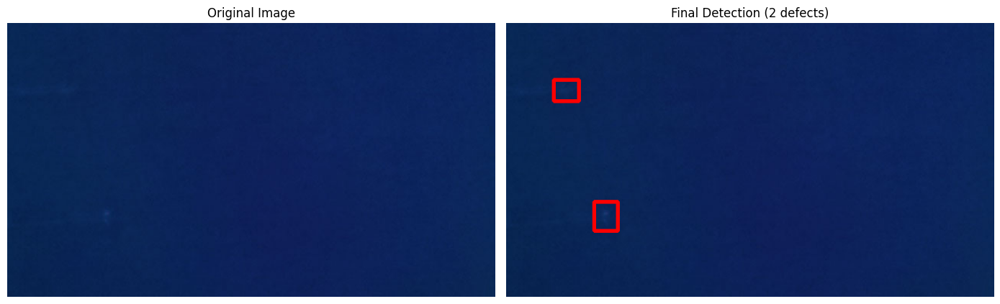

In [23]:
IMAGE_PATH = "/kaggle/input/fabric-defect-dataset/Data Set/horizontal/1.jpg"

final_boxes = run_all_classical_detectors(IMAGE_PATH)
visualize_final_boxes(IMAGE_PATH, final_boxes)

Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/10.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 1 raw candidates. Merging...
  -> Final Defect Count: 0


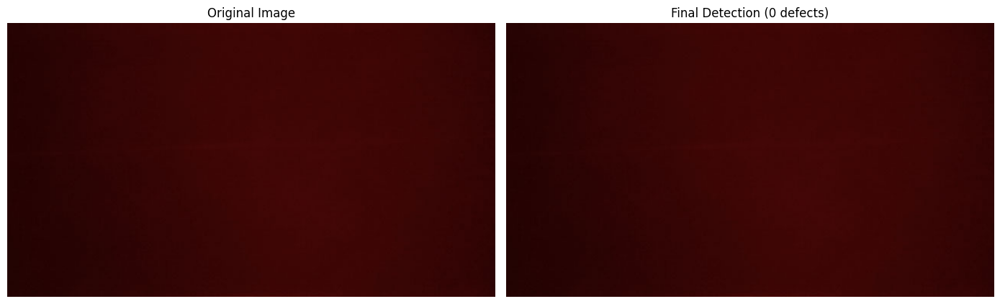

In [24]:
IMAGE_PATH = "/kaggle/input/fabric-defect-dataset/Data Set/horizontal/10.jpg"

final_boxes = run_all_classical_detectors(IMAGE_PATH)
visualize_final_boxes(IMAGE_PATH, final_boxes)

Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/14.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 8 raw candidates. Merging...
  -> Final Defect Count: 5


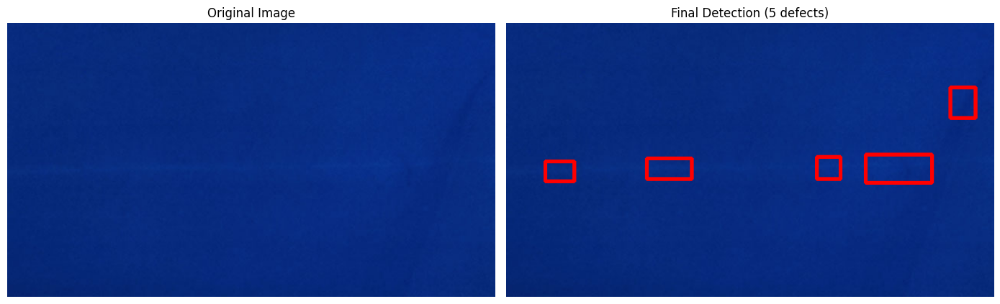

In [25]:
IMAGE_PATH = "/kaggle/input/fabric-defect-dataset/Data Set/horizontal/14.jpg"

final_boxes = run_all_classical_detectors(IMAGE_PATH)
visualize_final_boxes(IMAGE_PATH, final_boxes)

Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/12.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 5 raw candidates. Merging...
  -> Final Defect Count: 3


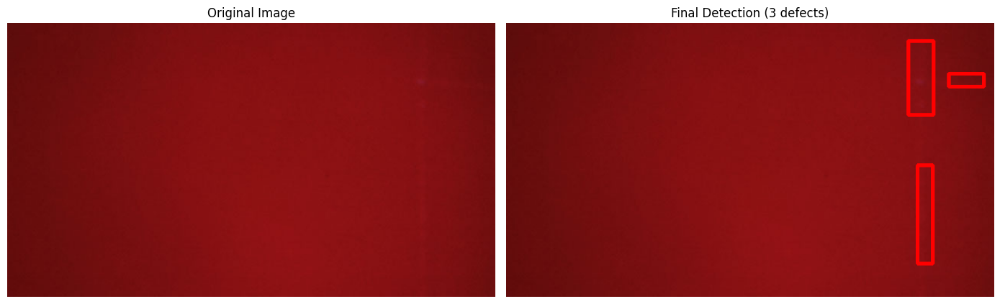

In [26]:
IMAGE_PATH = "/kaggle/input/fabric-defect-dataset/Data Set/verticle/12.jpg"

final_boxes = run_all_classical_detectors(IMAGE_PATH)
visualize_final_boxes(IMAGE_PATH, final_boxes)

Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/22.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 2 raw candidates. Merging...
  -> Final Defect Count: 1


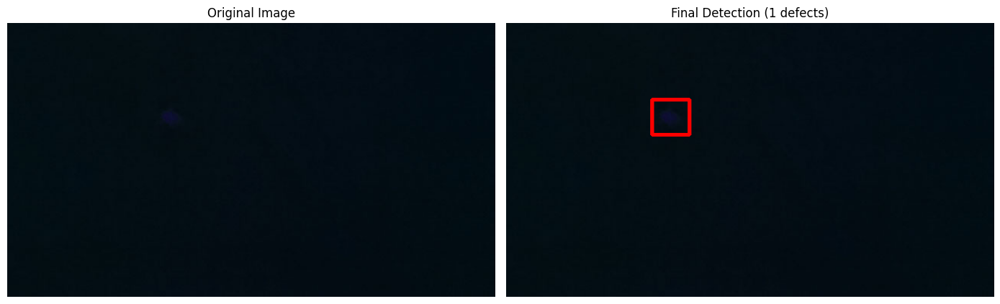

In [27]:
IMAGE_PATH = "/kaggle/input/fabric-defect-dataset/Data Set/hole/22.jpg"

final_boxes = run_all_classical_detectors(IMAGE_PATH)
visualize_final_boxes(IMAGE_PATH, final_boxes)

Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/22.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 2 raw candidates. Merging...
  -> Final Defect Count: 1


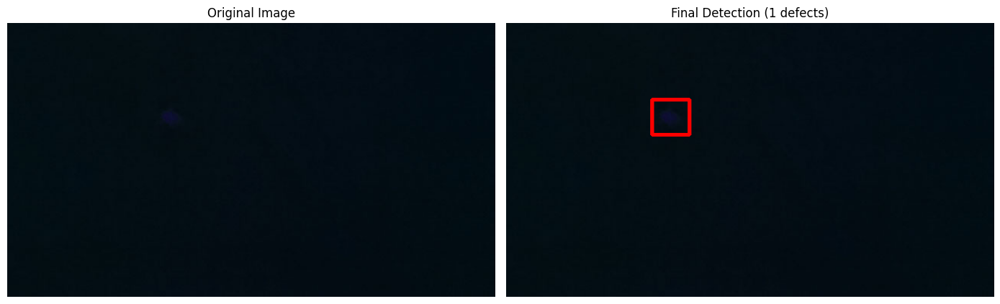

In [28]:
IMAGE_PATH = "/kaggle/input/fabric-defect-dataset/Data Set/hole/22.jpg"

final_boxes = run_all_classical_detectors(IMAGE_PATH)
visualize_final_boxes(IMAGE_PATH, final_boxes)

Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/23.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 2 raw candidates. Merging...
  -> Final Defect Count: 1


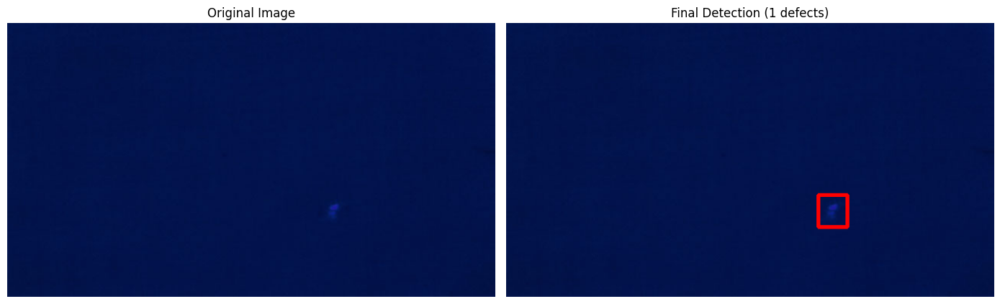

In [29]:
IMAGE_PATH = "/kaggle/input/fabric-defect-dataset/Data Set/hole/23.jpg"

final_boxes = run_all_classical_detectors(IMAGE_PATH)
visualize_final_boxes(IMAGE_PATH, final_boxes)

Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/26.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 3 raw candidates. Merging...
  -> Final Defect Count: 1


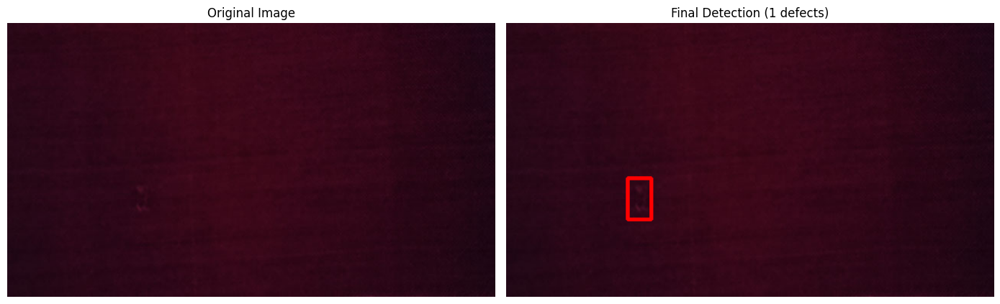

In [30]:
IMAGE_PATH = "/kaggle/input/fabric-defect-dataset/Data Set/hole/26.jpg"

final_boxes = run_all_classical_detectors(IMAGE_PATH)
visualize_final_boxes(IMAGE_PATH, final_boxes)

Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/29.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 3 raw candidates. Merging...
  -> Final Defect Count: 2


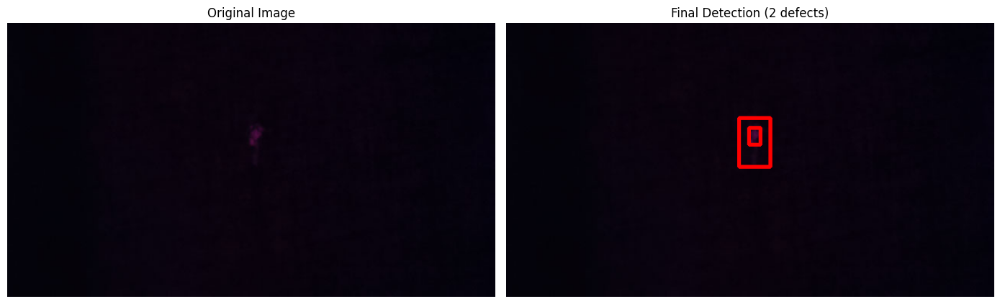

In [31]:
IMAGE_PATH = "/kaggle/input/fabric-defect-dataset/Data Set/hole/29.jpg"

final_boxes = run_all_classical_detectors(IMAGE_PATH)
visualize_final_boxes(IMAGE_PATH, final_boxes)

Found 184 images.

--- Processing 21_processed (3).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/21_processed (3).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 3 raw candidates. Merging...
  -> Final Defect Count: 1


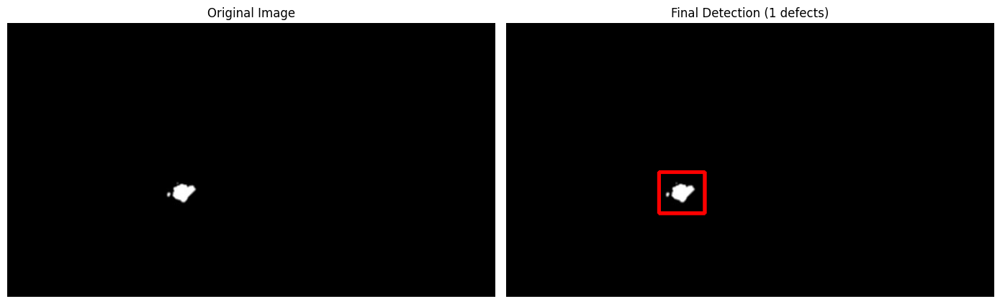


--- Processing 29_processed (1).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/29_processed (1).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 6 raw candidates. Merging...
  -> Final Defect Count: 1


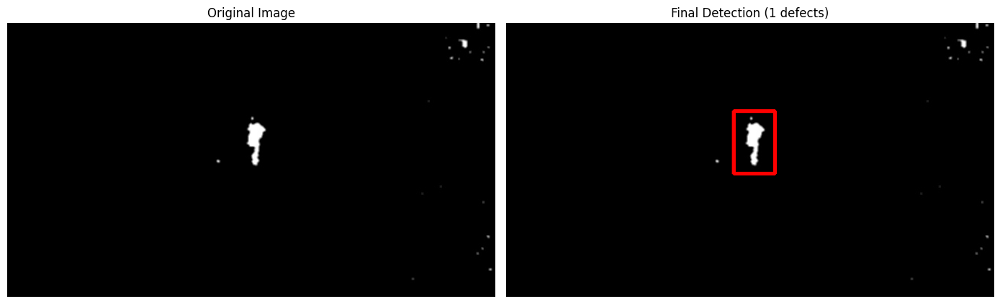


--- Processing 46_processed (1).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/46_processed (1).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 10 raw candidates. Merging...
  -> Final Defect Count: 3


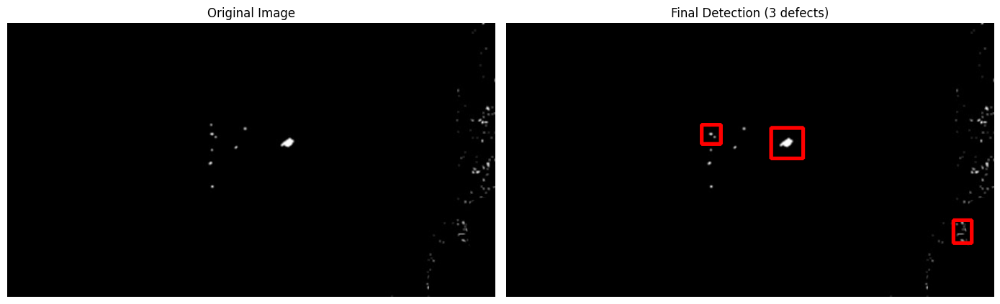


--- Processing 45.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/45.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 2 raw candidates. Merging...
  -> Final Defect Count: 1


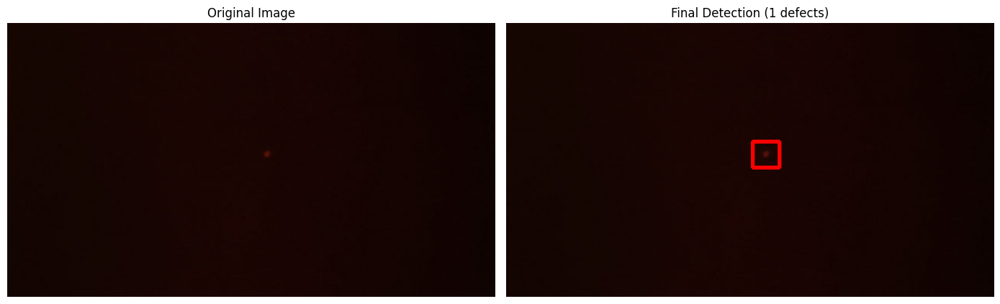


--- Processing 20.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/20.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 3 raw candidates. Merging...
  -> Final Defect Count: 2


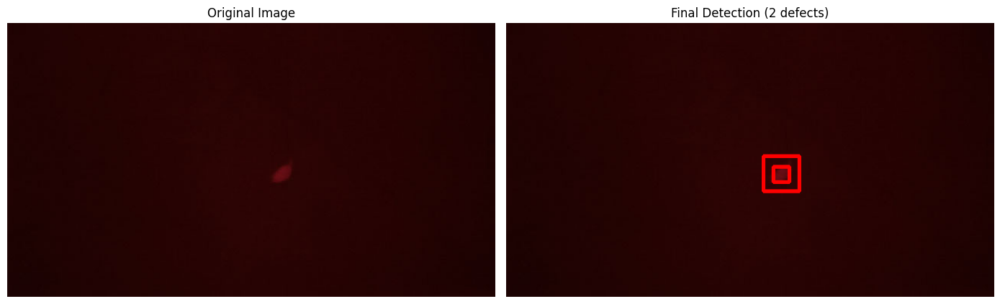


--- Processing 6.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/6.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 2 raw candidates. Merging...
  -> Final Defect Count: 1


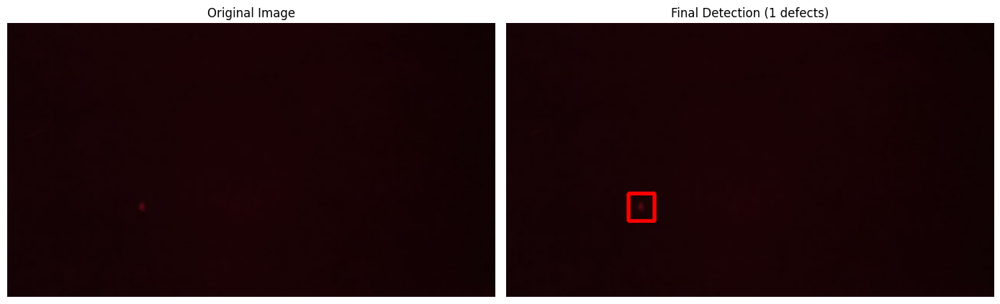


--- Processing 5_processed (3).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/5_processed (3).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 3 raw candidates. Merging...
  -> Final Defect Count: 1


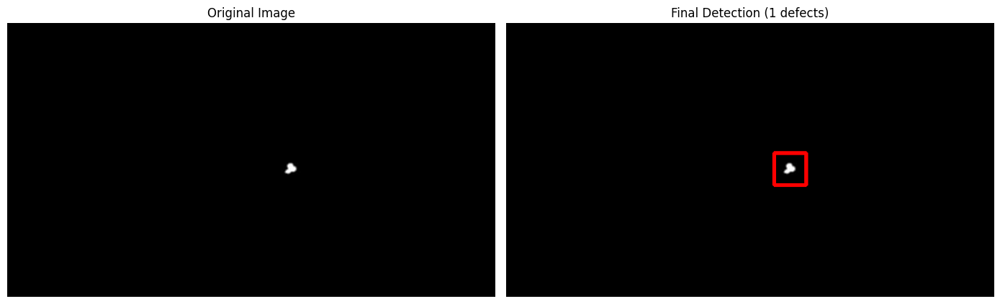


--- Processing 7_processed (1).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/7_processed (1).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 19 raw candidates. Merging...
  -> Final Defect Count: 4


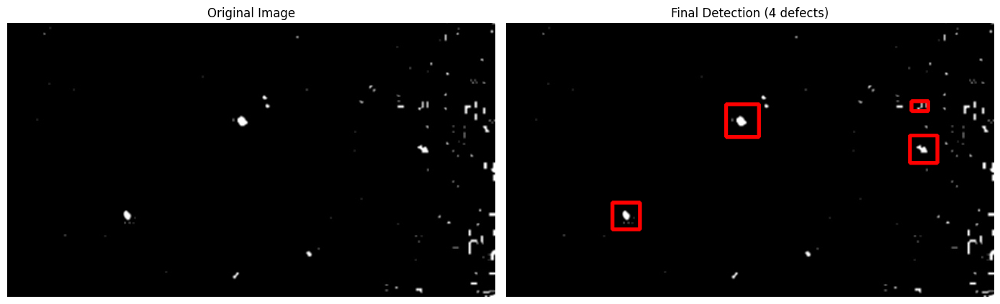


--- Processing 7_processed (2).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/7_processed (2).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 8 raw candidates. Merging...
  -> Final Defect Count: 2


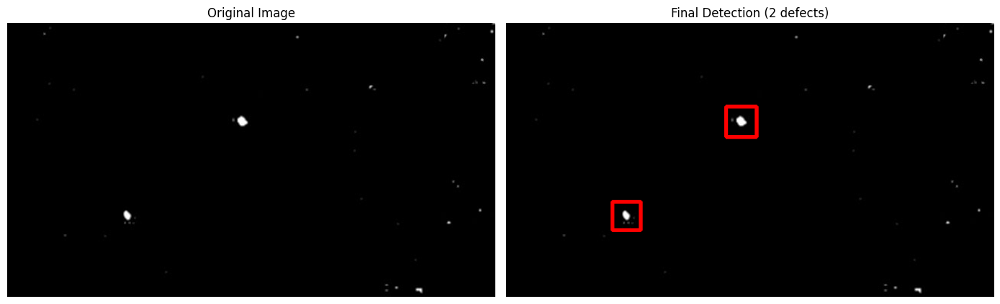


--- Processing 11_processed (3).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/11_processed (3).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 3 raw candidates. Merging...
  -> Final Defect Count: 1


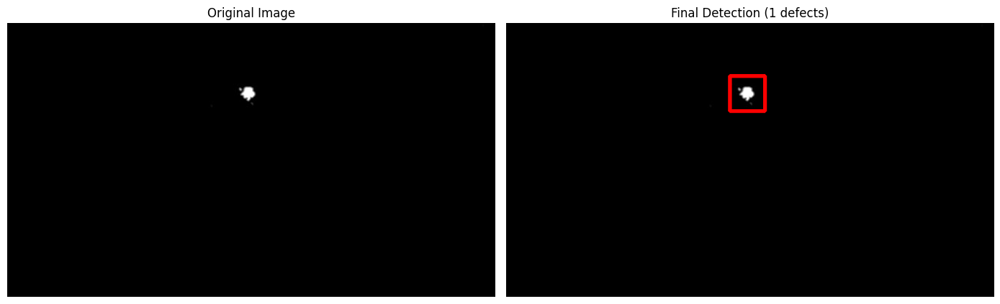


--- Processing 32_processed (1).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/32_processed (1).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 14 raw candidates. Merging...
  -> Final Defect Count: 6


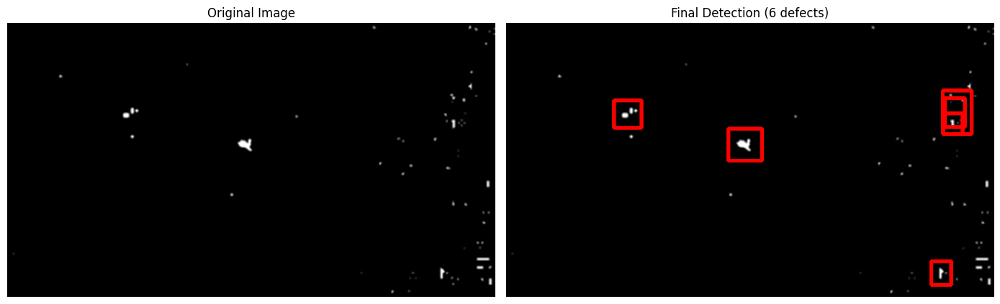


--- Processing 5.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/5.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 3 raw candidates. Merging...
  -> Final Defect Count: 1


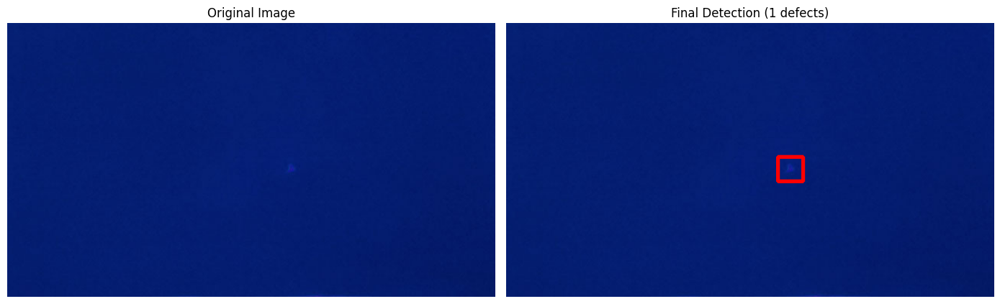


--- Processing 8.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/8.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 4 raw candidates. Merging...
  -> Final Defect Count: 2


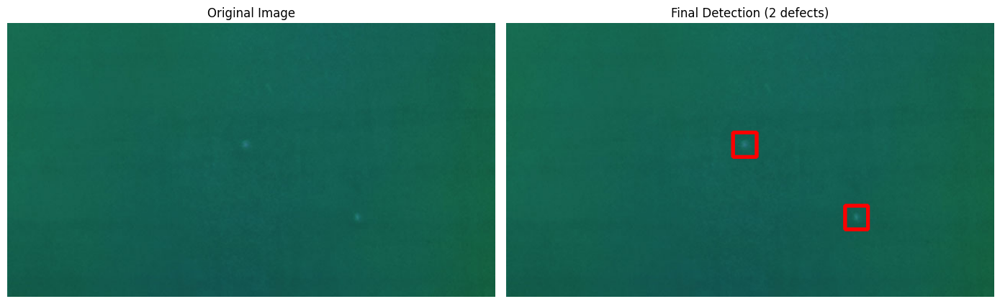


--- Processing 9_processed (2).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/9_processed (2).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 4 raw candidates. Merging...
  -> Final Defect Count: 1


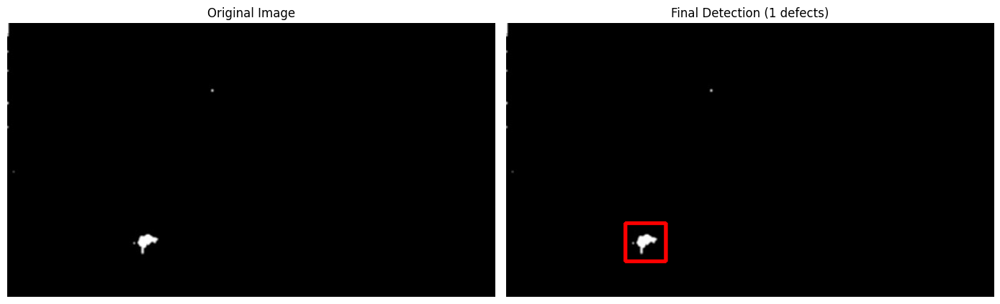


--- Processing 22_processed (1).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/hole/22_processed (1).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 3 raw candidates. Merging...
  -> Final Defect Count: 1


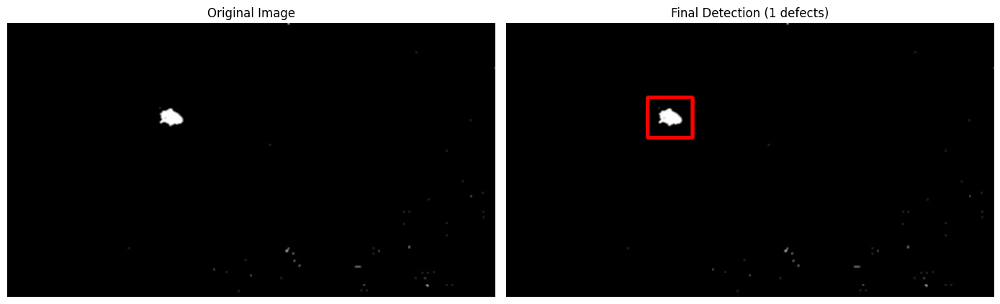

In [33]:
import os
import glob

# Path to your test images
folder_path = "/kaggle/input/fabric-defect-dataset/Data Set/hole/"
image_paths = glob.glob(os.path.join(folder_path, "*.jpg"))

print(f"Found {len(image_paths)} images.")

for img_path in image_paths[:15]:  # Test on first 15
    print(f"\n--- Processing {os.path.basename(img_path)} ---")
    final_boxes = run_all_classical_detectors(img_path)
    visualize_final_boxes(img_path, final_boxes) # Uncomment to see them one by one

Found 157 images.

--- Processing line_2018-10-10 11_47_11.774737.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/line_2018-10-10 11_47_11.774737.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 11 raw candidates. Merging...
  -> Final Defect Count: 6


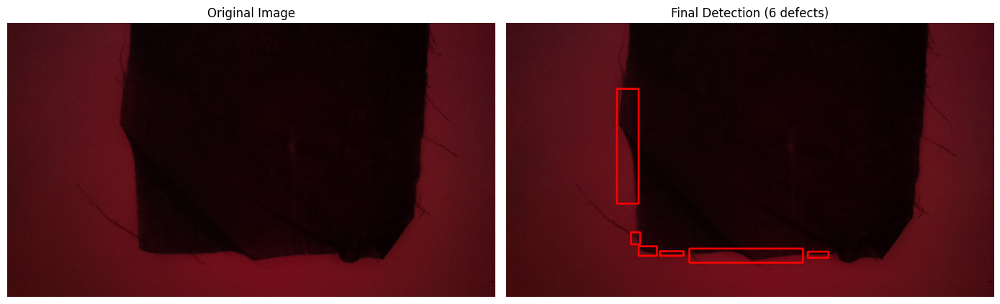


--- Processing line_2018-10-10 11_44_44.645529.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/line_2018-10-10 11_44_44.645529.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 7 raw candidates. Merging...
  -> Final Defect Count: 1


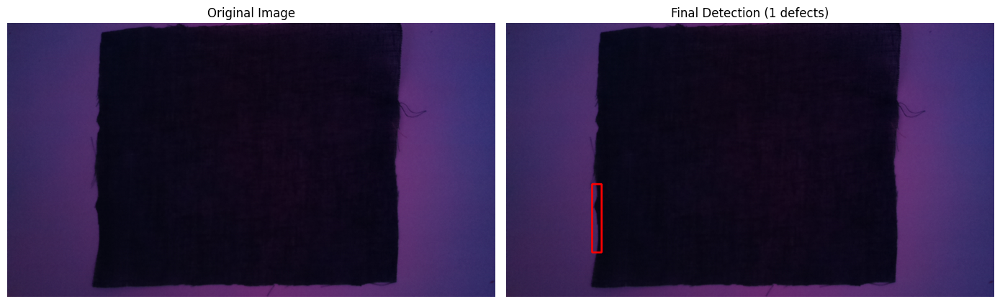


--- Processing line_2018-10-10 10_29_47.995625.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/line_2018-10-10 10_29_47.995625.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 10 raw candidates. Merging...
  -> Final Defect Count: 4


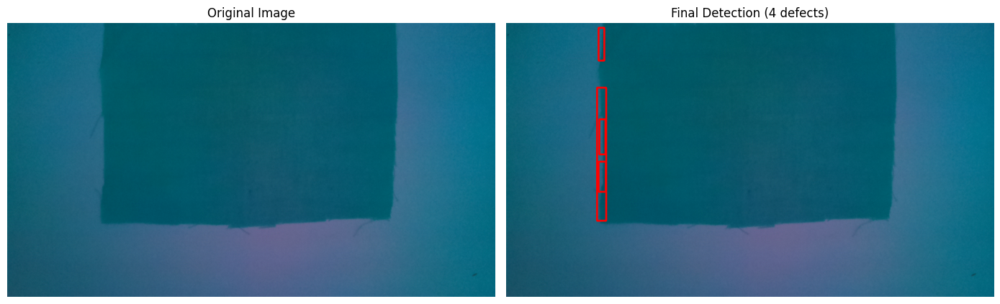


--- Processing line_2018-10-10 10_30_25.985902.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/line_2018-10-10 10_30_25.985902.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 12 raw candidates. Merging...
  -> Final Defect Count: 7


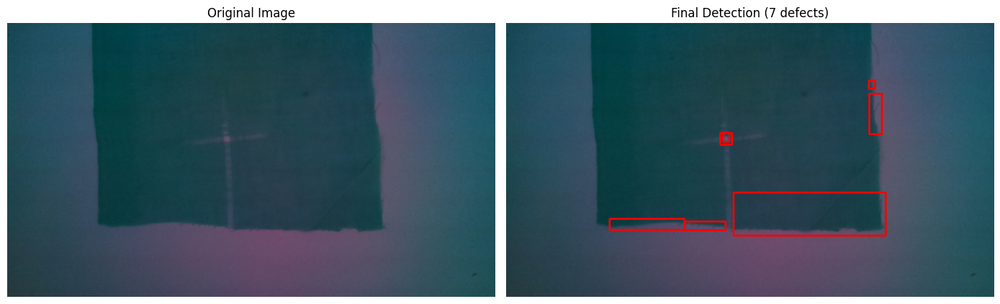


--- Processing line_2018-10-10 11_38_55.146448.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/line_2018-10-10 11_38_55.146448.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 3 raw candidates. Merging...
  -> Final Defect Count: 0


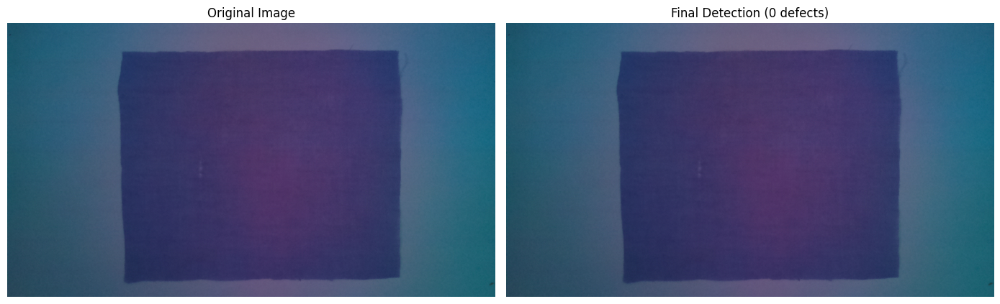


--- Processing line_2018-10-10 10_49_24.348542.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/line_2018-10-10 10_49_24.348542.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 14 raw candidates. Merging...
  -> Final Defect Count: 10


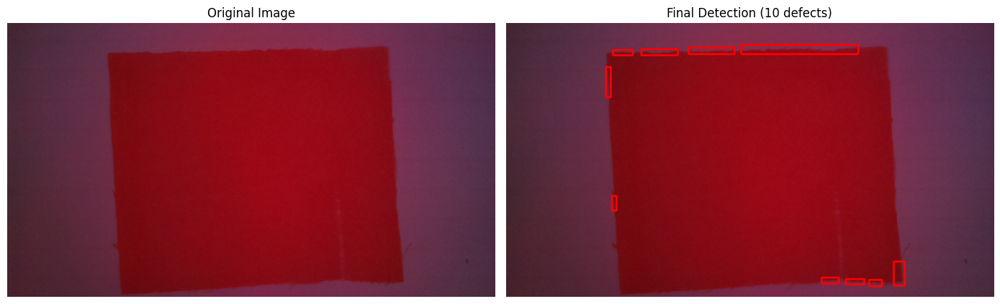


--- Processing line_2018-10-10 10_51_33.704789.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/line_2018-10-10 10_51_33.704789.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 8 raw candidates. Merging...
  -> Final Defect Count: 4


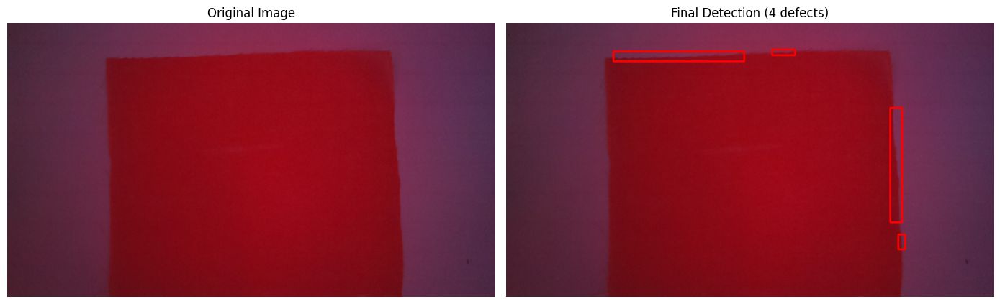


--- Processing line_2018-10-10 09_48_34.534930.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/line_2018-10-10 09_48_34.534930.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 3 raw candidates. Merging...
  -> Final Defect Count: 0


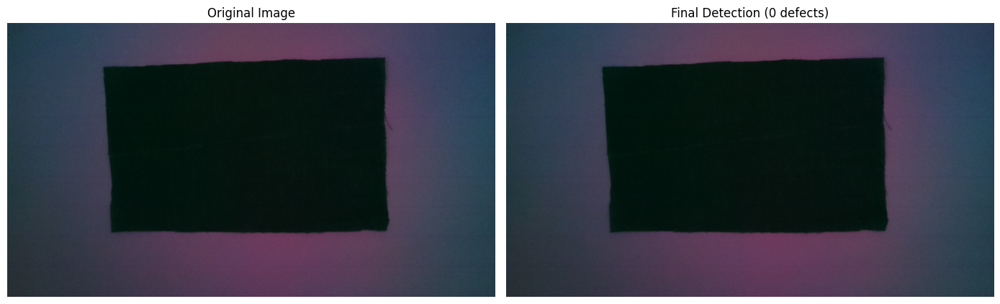


--- Processing line_2018-10-10 11_25_38.934816.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/line_2018-10-10 11_25_38.934816.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 8 raw candidates. Merging...
  -> Final Defect Count: 4


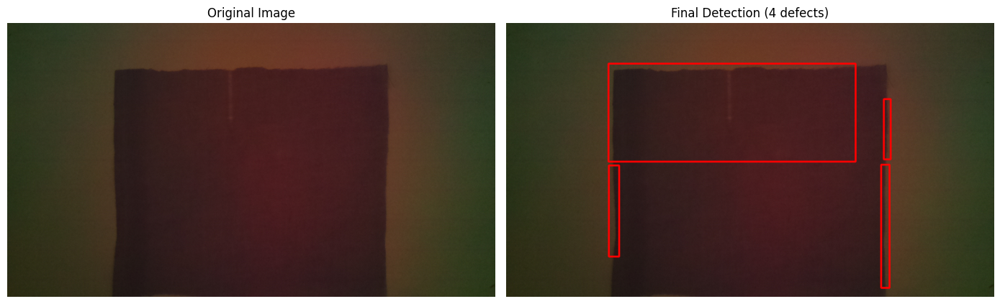


--- Processing 20180531_140818.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/20180531_140818.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 300 raw candidates. Merging...
  -> Final Defect Count: 278


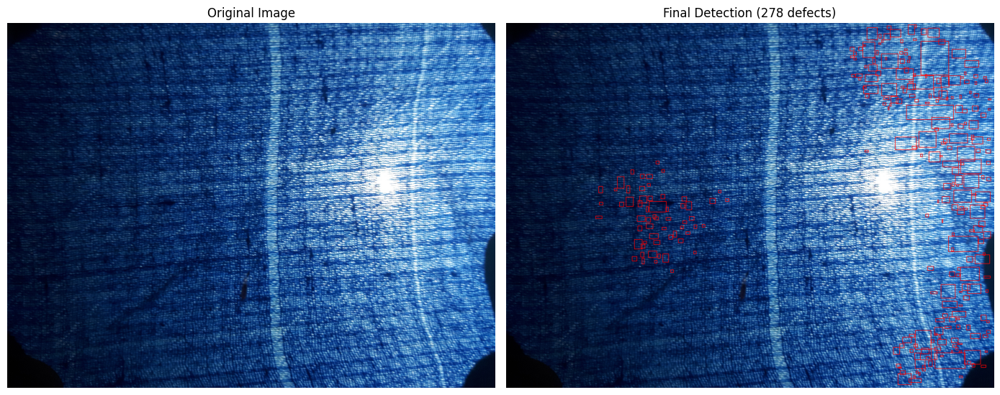


--- Processing line_2018-10-10 10_28_42.608859.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/line_2018-10-10 10_28_42.608859.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 10 raw candidates. Merging...
  -> Final Defect Count: 7


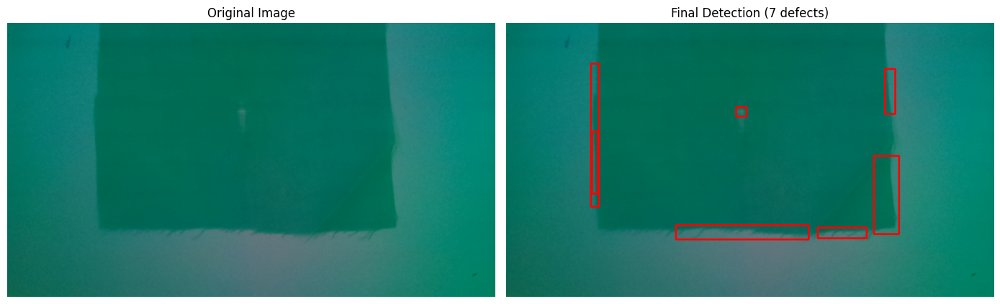


--- Processing line_2018-10-10 11_17_16.895198.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/line_2018-10-10 11_17_16.895198.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 9 raw candidates. Merging...
  -> Final Defect Count: 2


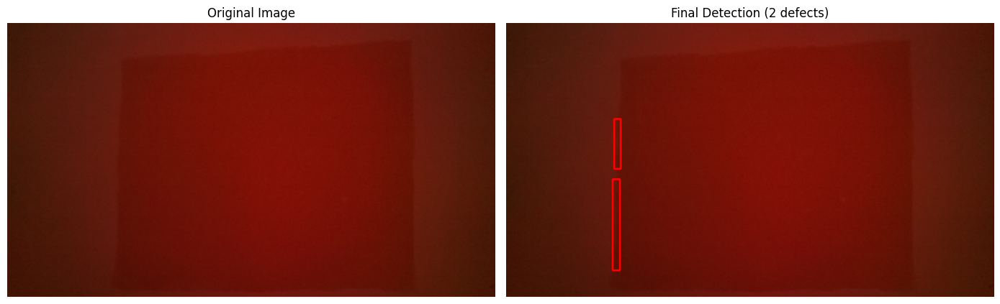


--- Processing line_2018-10-10 10_28_02.010387.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/line_2018-10-10 10_28_02.010387.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 7 raw candidates. Merging...
  -> Final Defect Count: 3


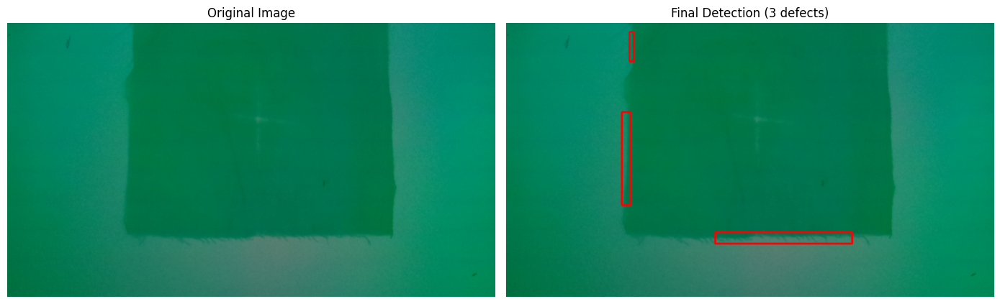


--- Processing line_2018-10-10 11_02_01.266587.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/line_2018-10-10 11_02_01.266587.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 6 raw candidates. Merging...
  -> Final Defect Count: 3


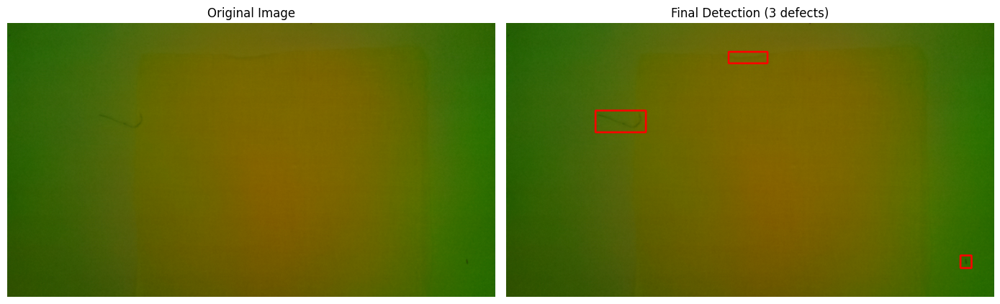


--- Processing line_2018-10-10 10_36_17.059749.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Lines/line_2018-10-10 10_36_17.059749.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 6 raw candidates. Merging...
  -> Final Defect Count: 2


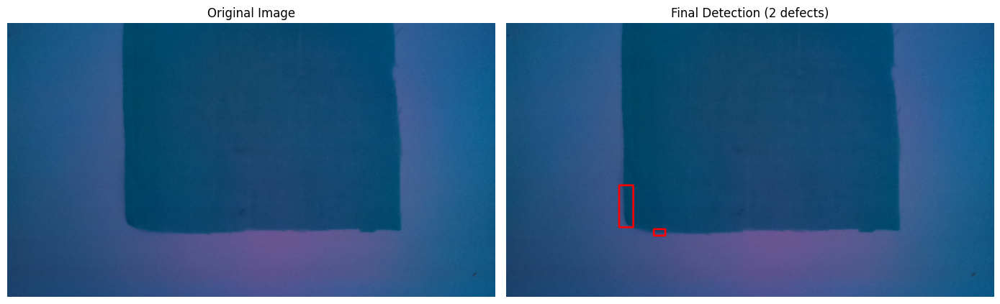

In [34]:
import os
import glob

# Path to your test images
folder_path = "/kaggle/input/fabric-defect-dataset/Data Set/captured/Lines"
image_paths = glob.glob(os.path.join(folder_path, "*.jpg"))

print(f"Found {len(image_paths)} images.")

for img_path in image_paths[:15]:  # Test on first 15
    print(f"\n--- Processing {os.path.basename(img_path)} ---")
    final_boxes = run_all_classical_detectors(img_path)
    visualize_final_boxes(img_path, final_boxes) # Uncomment to see them one by one

Found 97 images.

--- Processing hole_2018-10-11 14_15_19.883078.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/hole_2018-10-11 14_15_19.883078.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 6 raw candidates. Merging...
  -> Final Defect Count: 3


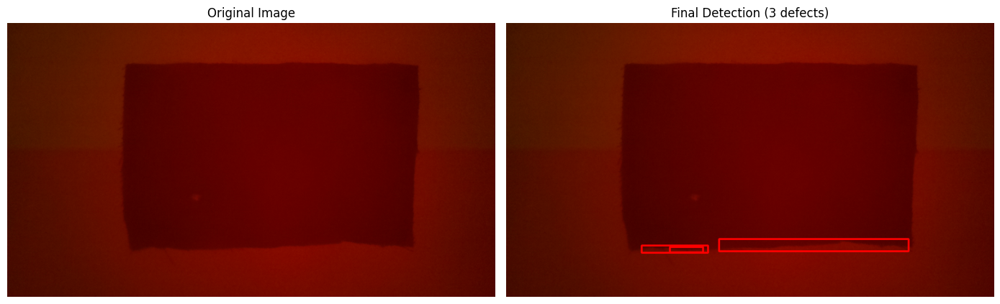


--- Processing hole_2018-10-11 14_12_12.817055.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/hole_2018-10-11 14_12_12.817055.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 6 raw candidates. Merging...
  -> Final Defect Count: 1


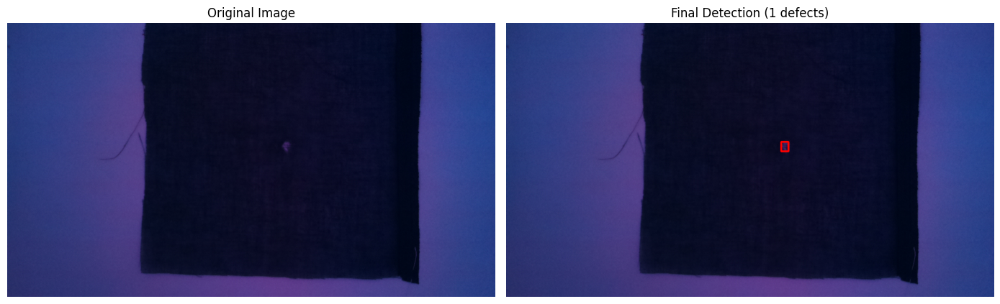


--- Processing hole_2018-10-11 13_37_21.538398.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/hole_2018-10-11 13_37_21.538398.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 3 raw candidates. Merging...
  -> Final Defect Count: 0


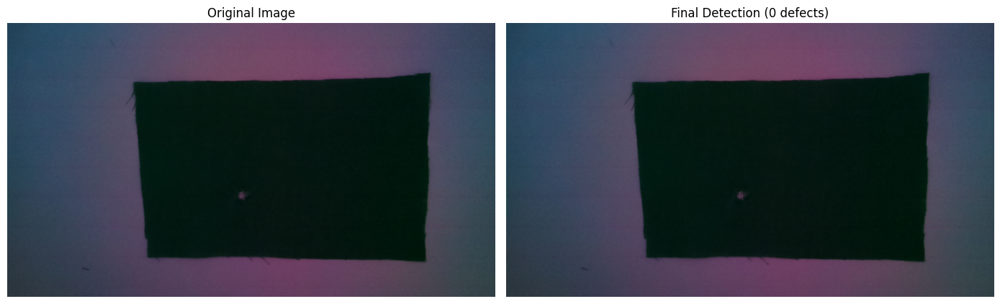


--- Processing hole_2018-10-11 13_07_50.381094.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/hole_2018-10-11 13_07_50.381094.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 10 raw candidates. Merging...
  -> Final Defect Count: 6


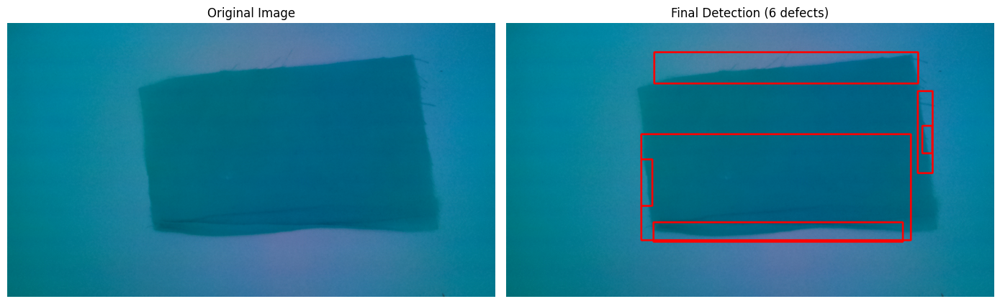


--- Processing hole_2018-10-11 13_46_12.139167.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/hole_2018-10-11 13_46_12.139167.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 2 raw candidates. Merging...
  -> Final Defect Count: 0


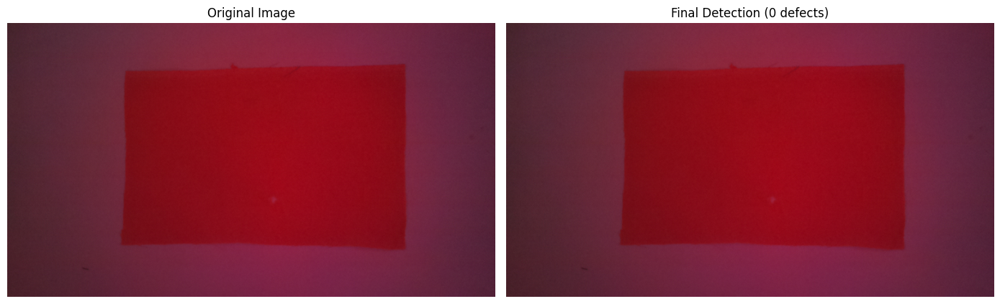


--- Processing hole_2018-10-11 13_29_59.046997.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/hole_2018-10-11 13_29_59.046997.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 2 raw candidates. Merging...
  -> Final Defect Count: 0


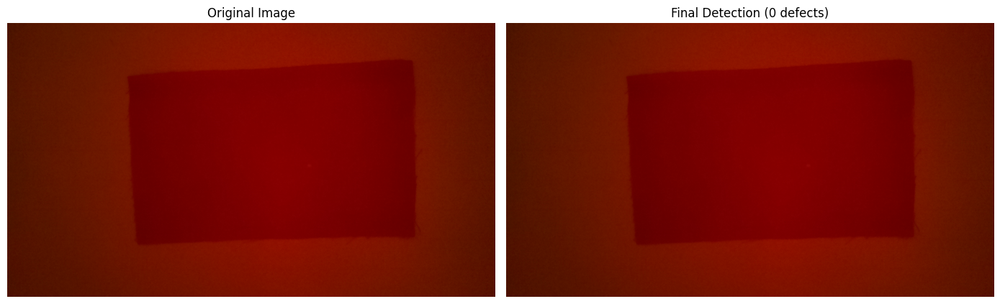


--- Processing hole_2018-10-11 13_31_19.754850.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/hole_2018-10-11 13_31_19.754850.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 5 raw candidates. Merging...
  -> Final Defect Count: 1


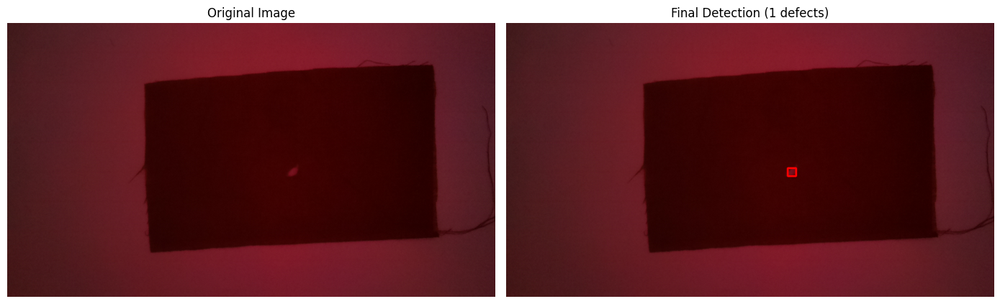


--- Processing 20180531_135032.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/20180531_135032.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 62 raw candidates. Merging...
  -> Final Defect Count: 48


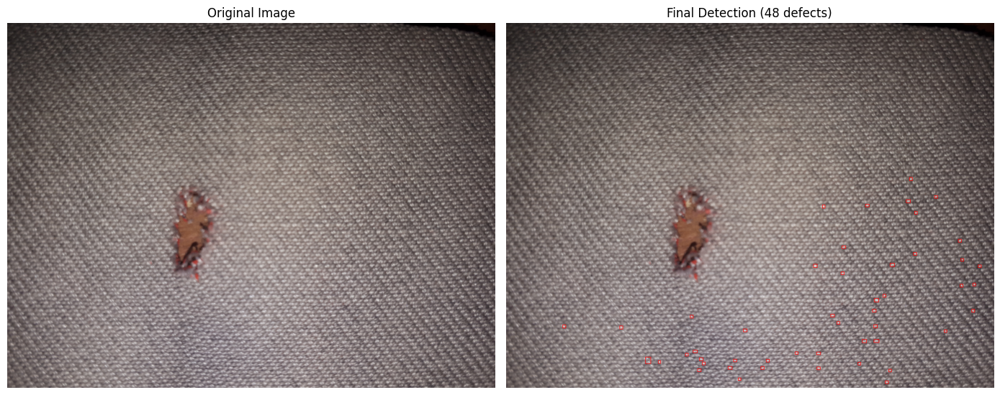


--- Processing hole_2018-10-11 14_21_03.016893.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/hole_2018-10-11 14_21_03.016893.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 11 raw candidates. Merging...
  -> Final Defect Count: 7


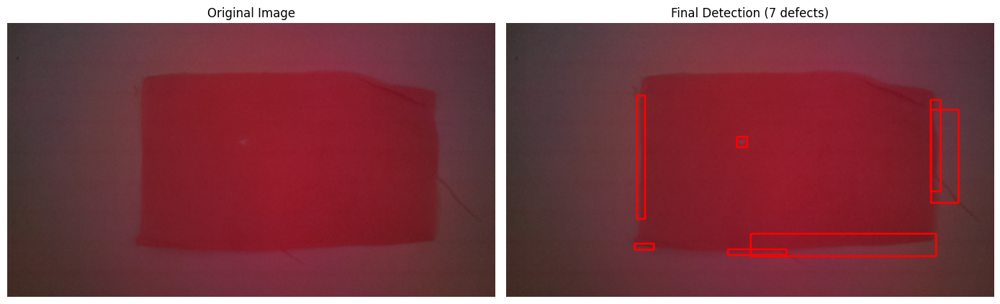


--- Processing 20180531_135111.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/20180531_135111.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 35 raw candidates. Merging...
  -> Final Defect Count: 29


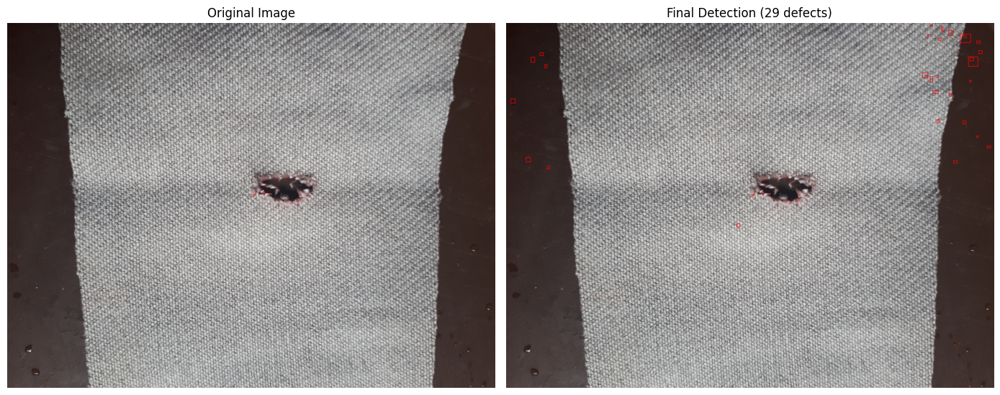


--- Processing hole_2018-10-11 13_58_04.423087.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/hole_2018-10-11 13_58_04.423087.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 12 raw candidates. Merging...
  -> Final Defect Count: 10


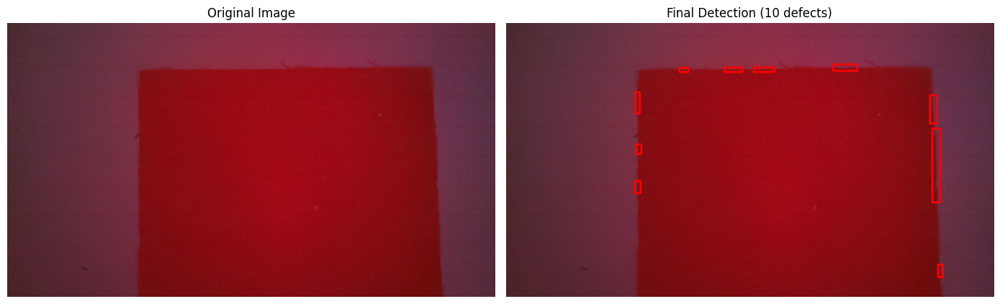


--- Processing hole_2018-10-11 14_12_56.878692.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/hole_2018-10-11 14_12_56.878692.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 4 raw candidates. Merging...
  -> Final Defect Count: 1


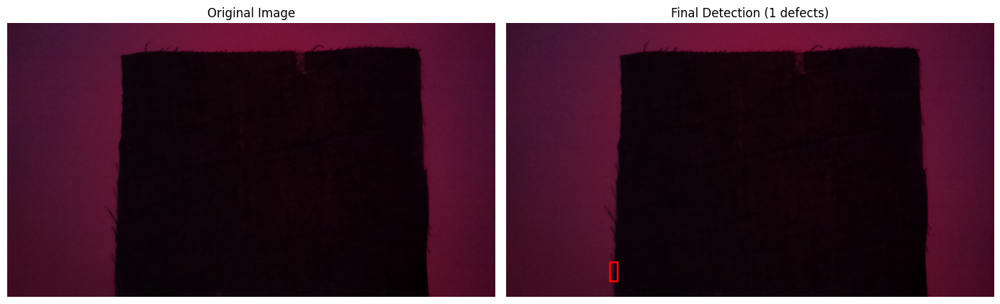


--- Processing hole_2018-10-11 13_07_10.156329.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/hole_2018-10-11 13_07_10.156329.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 4 raw candidates. Merging...
  -> Final Defect Count: 0


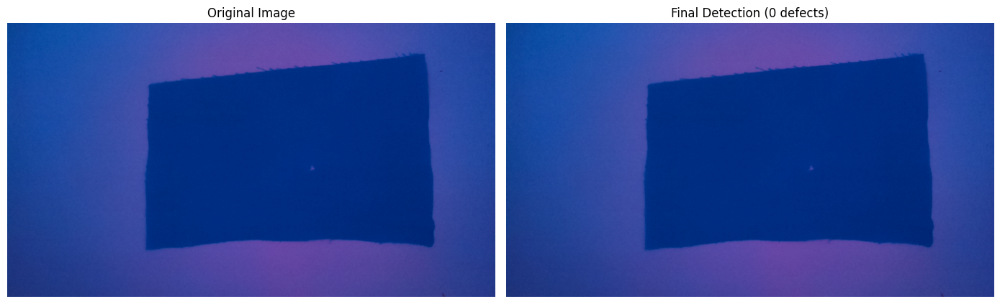


--- Processing hole_2018-10-11 13_19_19.118362.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/hole_2018-10-11 13_19_19.118362.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 18 raw candidates. Merging...
  -> Final Defect Count: 9


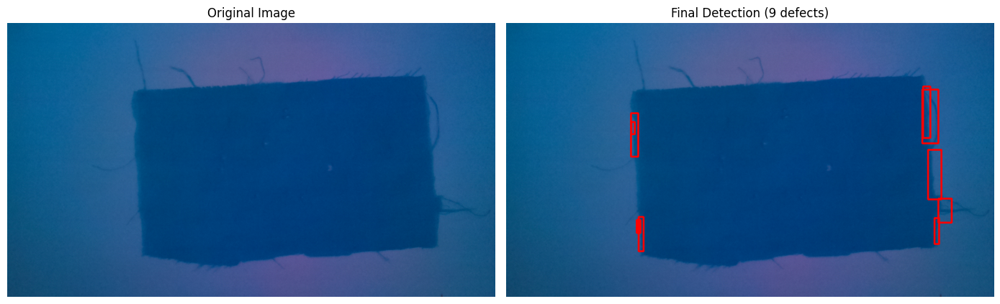


--- Processing hole_2018-10-11 13_25_54.995114.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/captured/Hole/hole_2018-10-11 13_25_54.995114.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 3 raw candidates. Merging...
  -> Final Defect Count: 0


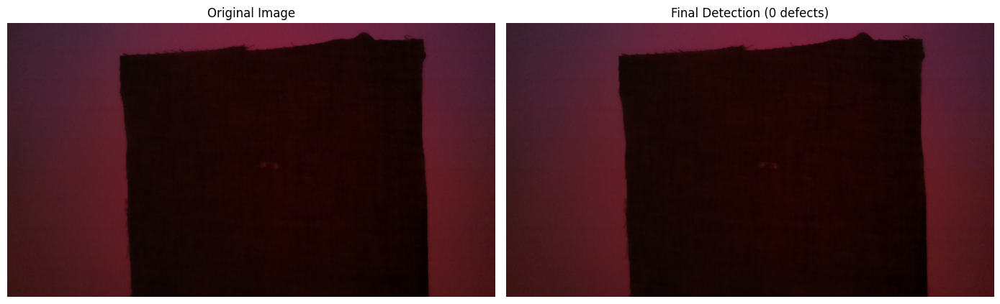

In [35]:
import os
import glob

# Path to your test images
folder_path = "/kaggle/input/fabric-defect-dataset/Data Set/captured/Hole"
image_paths = glob.glob(os.path.join(folder_path, "*.jpg"))

print(f"Found {len(image_paths)} images.")

for img_path in image_paths[:15]:  # Test on first 15
    print(f"\n--- Processing {os.path.basename(img_path)} ---")
    final_boxes = run_all_classical_detectors(img_path)
    visualize_final_boxes(img_path, final_boxes) # Uncomment to see them one by one

Found 136 images.

--- Processing 21_processed (3).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/21_processed (3).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 13 raw candidates. Merging...
  -> Final Defect Count: 5


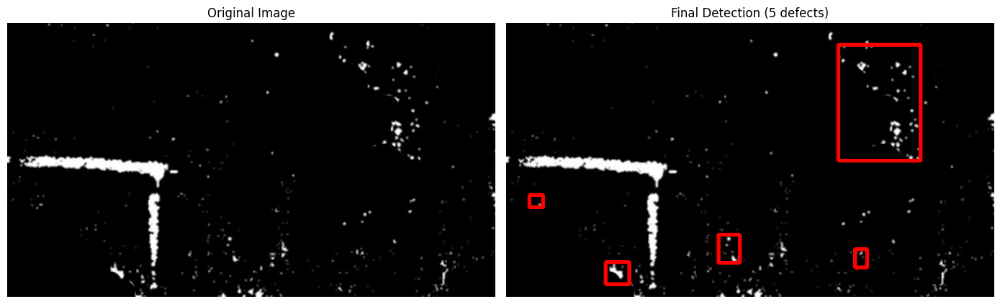


--- Processing 29_processed (1).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/29_processed (1).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 11 raw candidates. Merging...
  -> Final Defect Count: 5


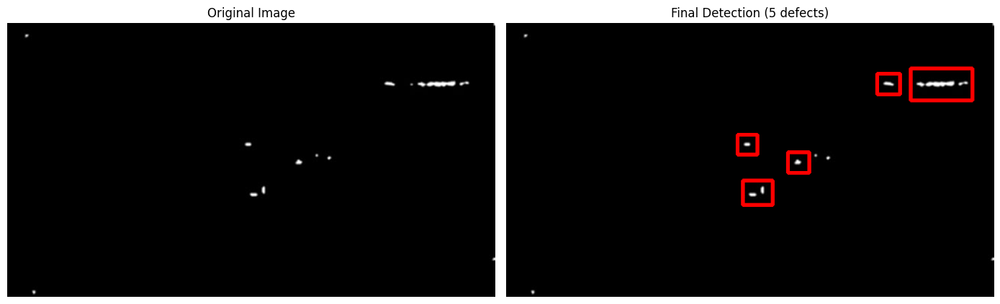


--- Processing 20.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/20.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 6 raw candidates. Merging...
  -> Final Defect Count: 2


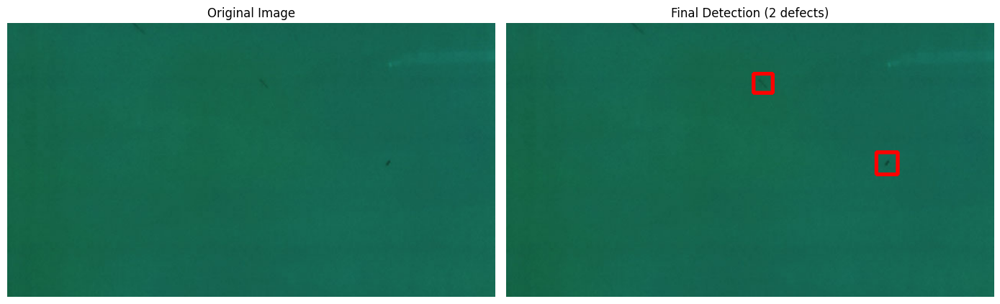


--- Processing 6.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/6.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 2 raw candidates. Merging...
  -> Final Defect Count: 1


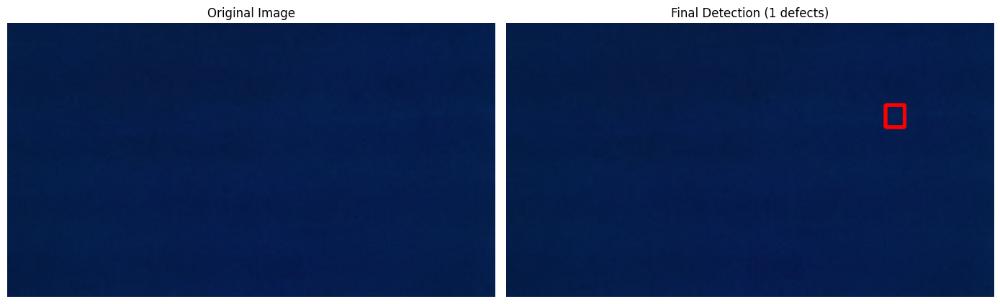


--- Processing 5_processed (3).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/5_processed (3).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 3 raw candidates. Merging...
  -> Final Defect Count: 1


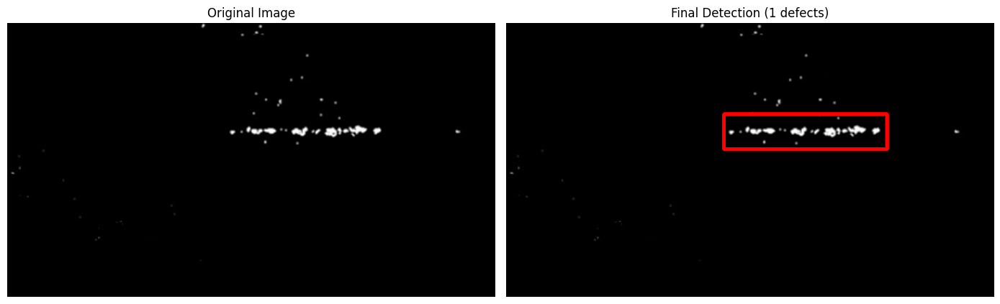


--- Processing 7_processed (1).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/7_processed (1).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 11 raw candidates. Merging...
  -> Final Defect Count: 4


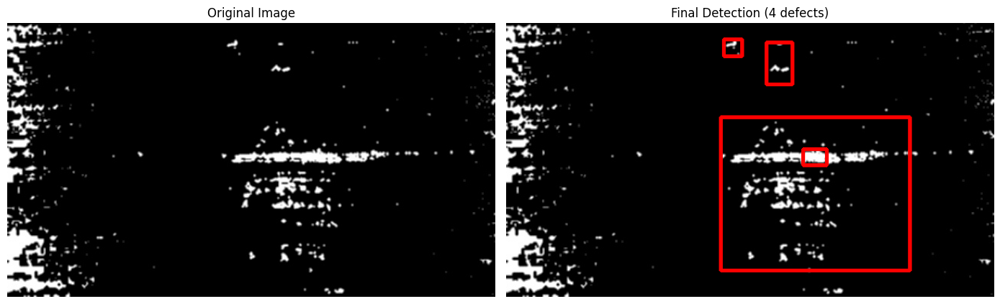


--- Processing 7_processed (2).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/7_processed (2).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 14 raw candidates. Merging...
  -> Final Defect Count: 6


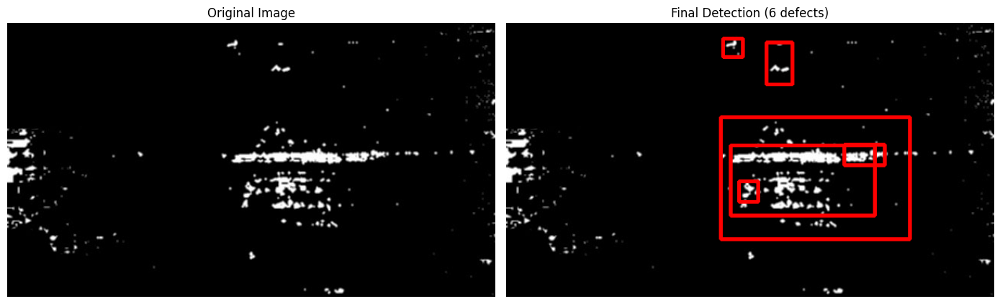


--- Processing 11_processed (3).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/11_processed (3).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 16 raw candidates. Merging...
  -> Final Defect Count: 6


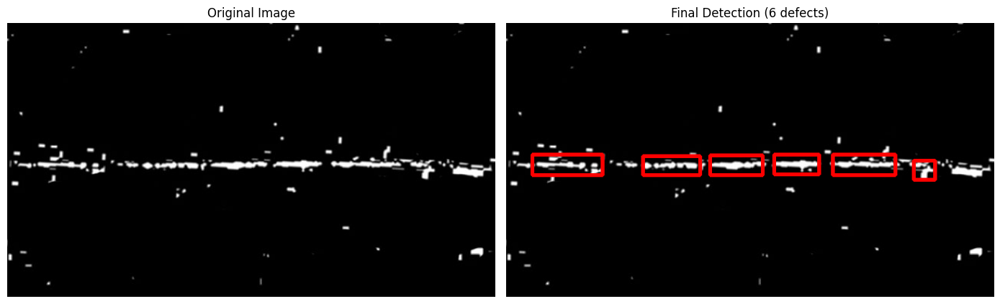


--- Processing 32_processed (1).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/32_processed (1).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 15 raw candidates. Merging...
  -> Final Defect Count: 7


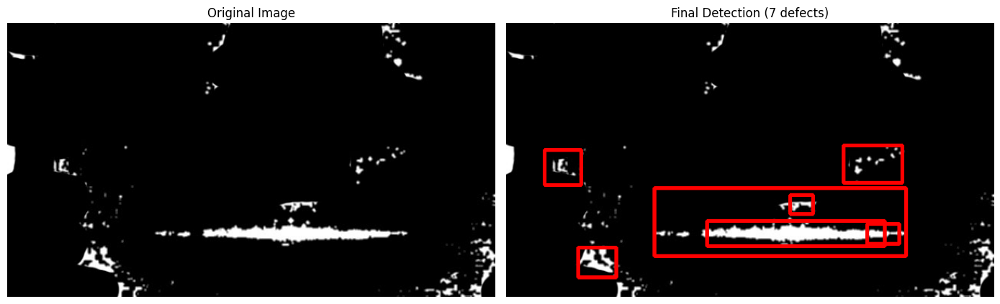


--- Processing 5.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/5.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 4 raw candidates. Merging...
  -> Final Defect Count: 2


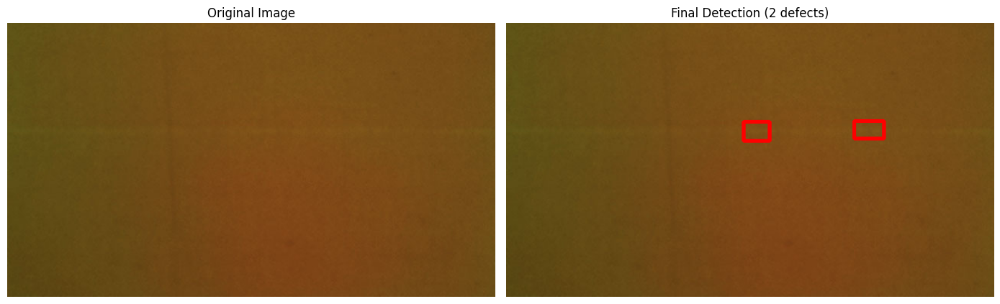


--- Processing 8.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/8.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 1 raw candidates. Merging...
  -> Final Defect Count: 1


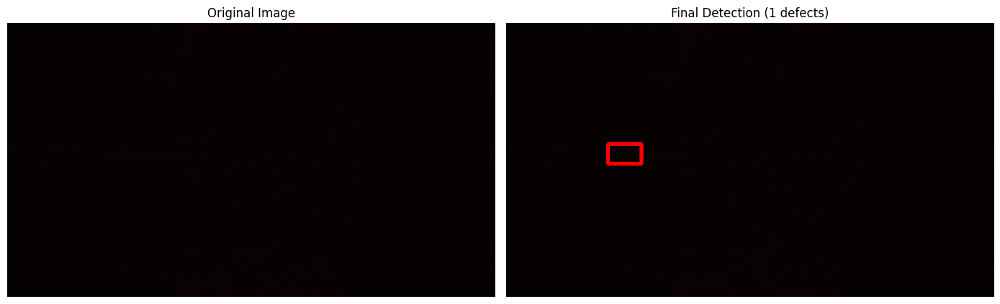


--- Processing 9_processed (2).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/9_processed (2).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 24 raw candidates. Merging...
  -> Final Defect Count: 12


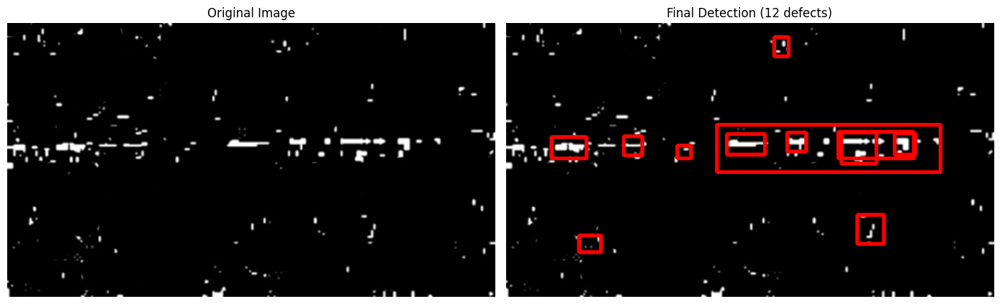


--- Processing 22_processed (1).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/22_processed (1).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 12 raw candidates. Merging...
  -> Final Defect Count: 7


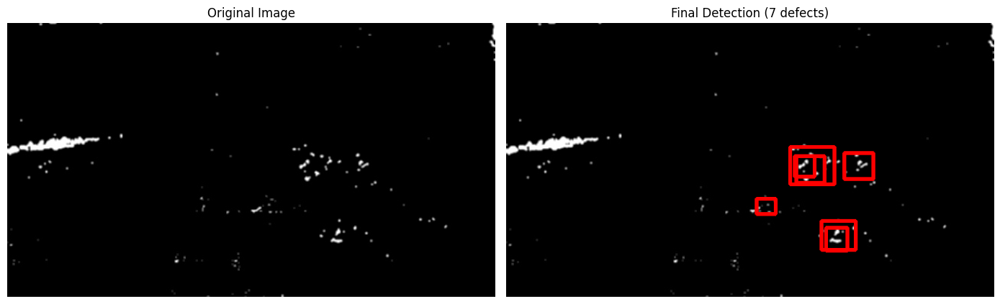


--- Processing 17_processed (3).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/17_processed (3).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 9 raw candidates. Merging...
  -> Final Defect Count: 2


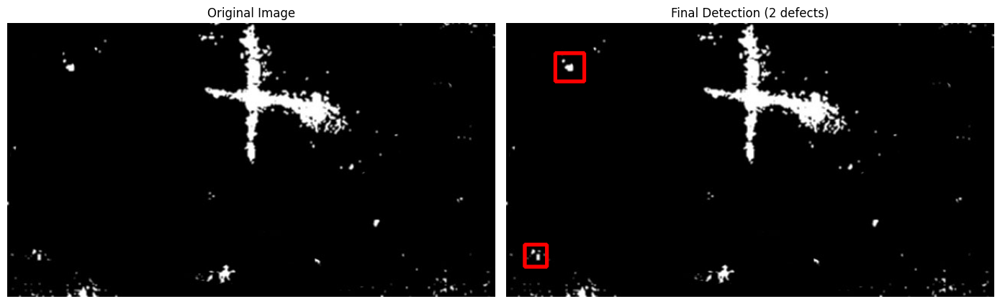


--- Processing 22_processed (2).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/horizontal/22_processed (2).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 4 raw candidates. Merging...
  -> Final Defect Count: 1


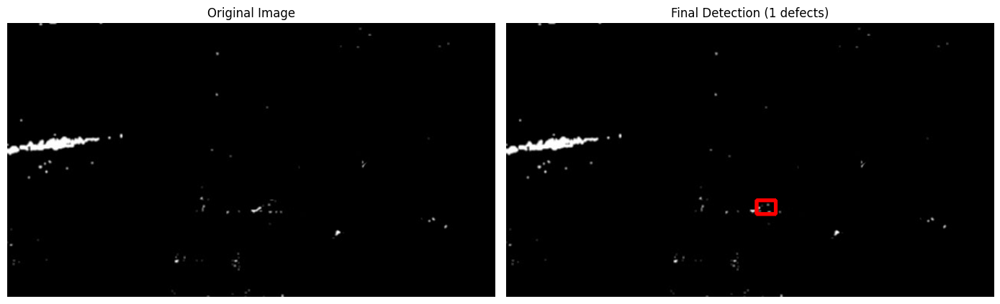

In [36]:
import os
import glob

# Path to your test images
folder_path = "/kaggle/input/fabric-defect-dataset/Data Set/horizontal"
image_paths = glob.glob(os.path.join(folder_path, "*.jpg"))

print(f"Found {len(image_paths)} images.")

for img_path in image_paths[:15]:  # Test on first 15
    print(f"\n--- Processing {os.path.basename(img_path)} ---")
    final_boxes = run_all_classical_detectors(img_path)
    visualize_final_boxes(img_path, final_boxes) # Uncomment to see them one by one

Found 92 images.

--- Processing 21_processed (3).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/21_processed (3).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 6 raw candidates. Merging...
  -> Final Defect Count: 2


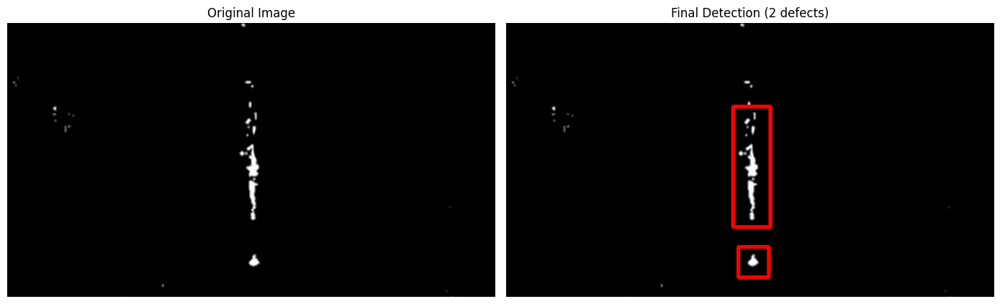


--- Processing 20.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/20.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 5 raw candidates. Merging...
  -> Final Defect Count: 2


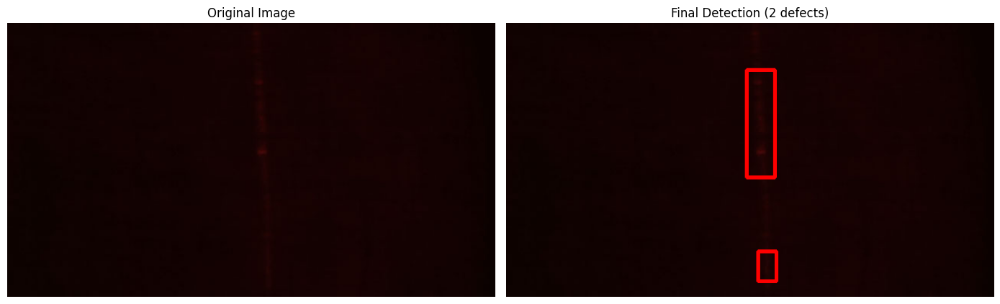


--- Processing 6.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/6.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 5 raw candidates. Merging...
  -> Final Defect Count: 3


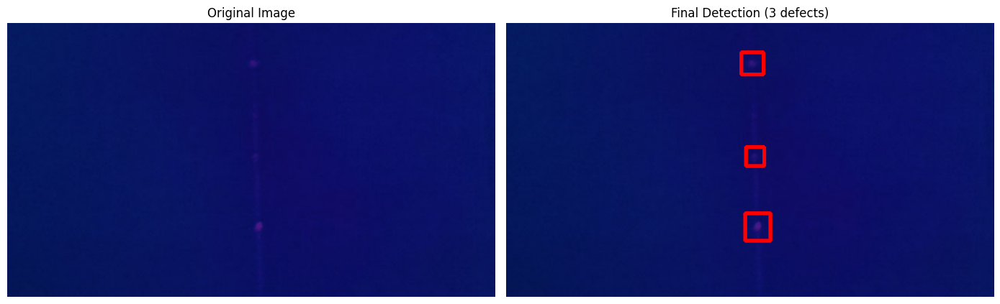


--- Processing 5_processed (3).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/5_processed (3).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 6 raw candidates. Merging...
  -> Final Defect Count: 2


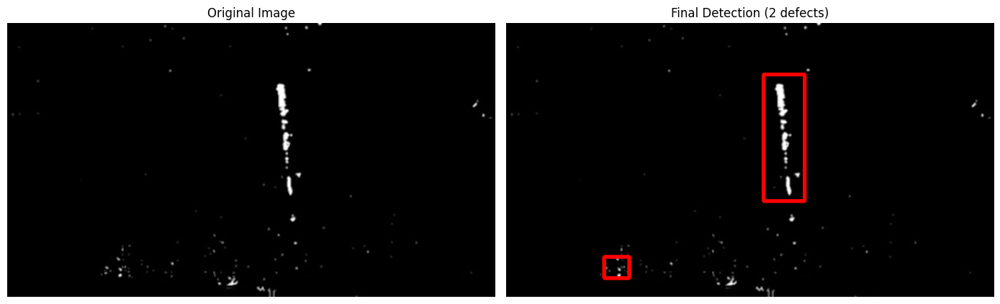


--- Processing 7_processed (1).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/7_processed (1).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 7 raw candidates. Merging...
  -> Final Defect Count: 4


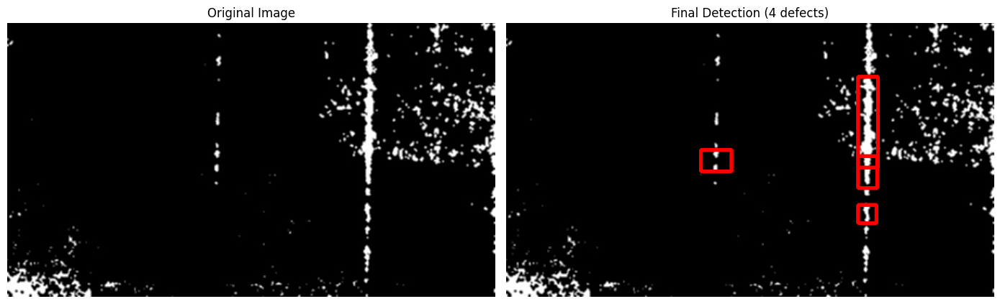


--- Processing 7_processed (2).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/7_processed (2).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 9 raw candidates. Merging...
  -> Final Defect Count: 2


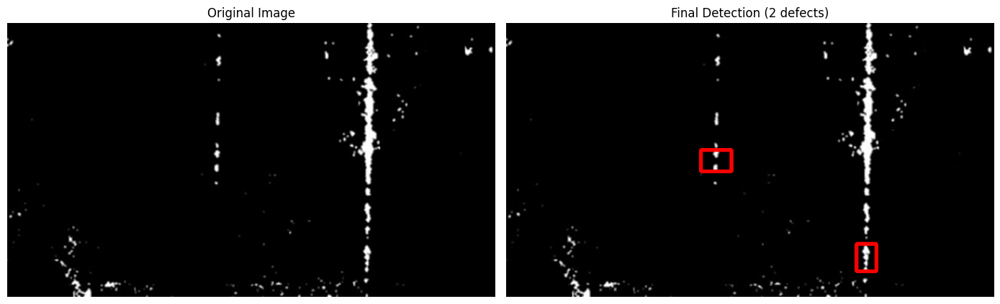


--- Processing 11_processed (3).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/11_processed (3).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 9 raw candidates. Merging...
  -> Final Defect Count: 1


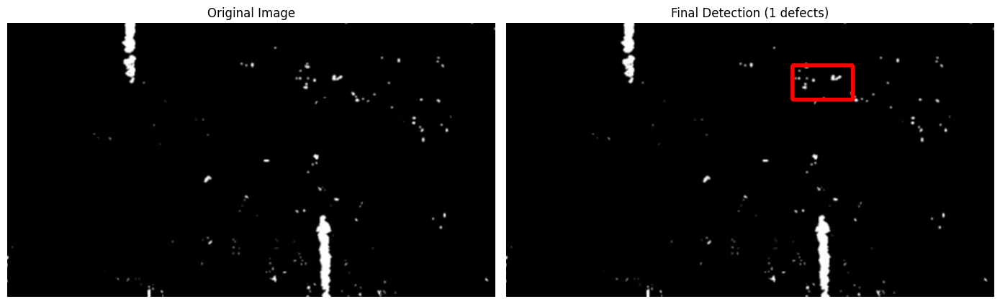


--- Processing 4_processed(3).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/4_processed(3).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 6 raw candidates. Merging...
  -> Final Defect Count: 0


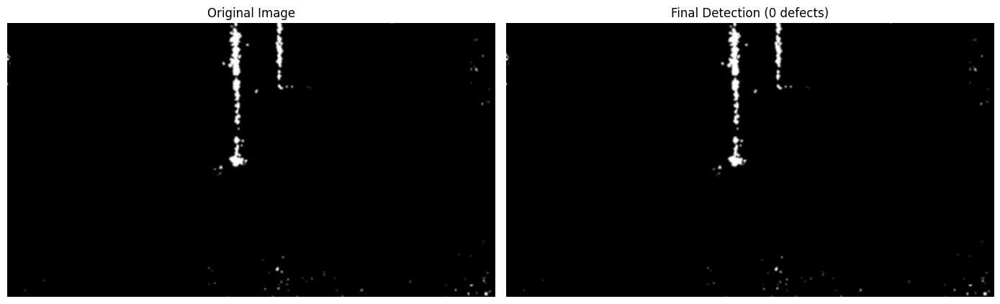


--- Processing 5.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/5.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 2 raw candidates. Merging...
  -> Final Defect Count: 0


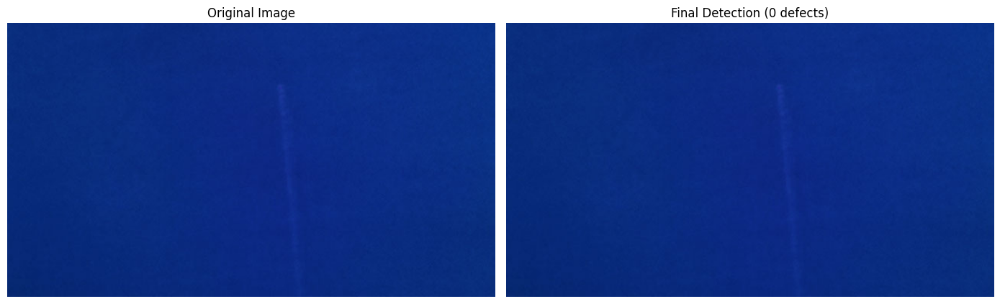


--- Processing 8.jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/8.jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 5 raw candidates. Merging...
  -> Final Defect Count: 2


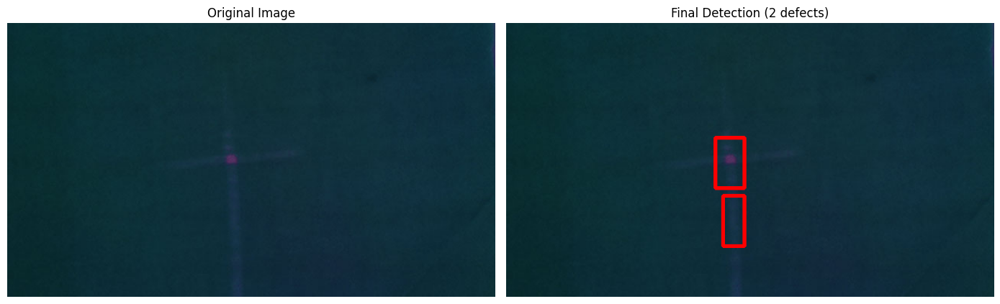


--- Processing 9_processed (2).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/9_processed (2).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 11 raw candidates. Merging...
  -> Final Defect Count: 1


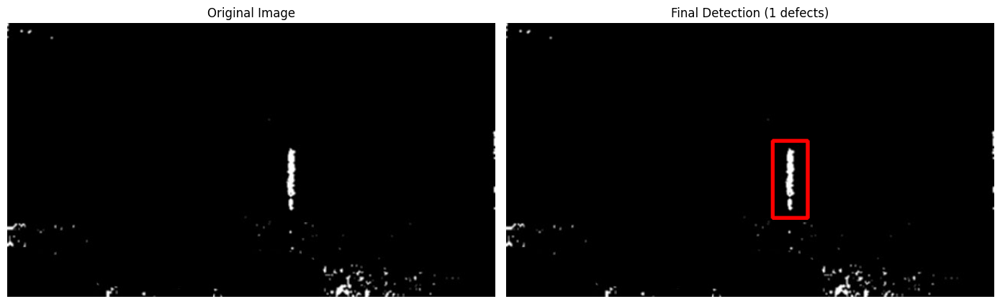


--- Processing 22_processed (1).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/22_processed (1).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 8 raw candidates. Merging...
  -> Final Defect Count: 2


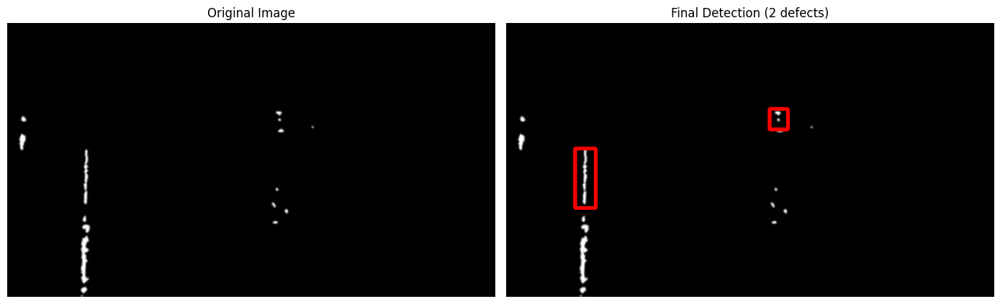


--- Processing 17_processed (3).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/17_processed (3).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 3 raw candidates. Merging...
  -> Final Defect Count: 0


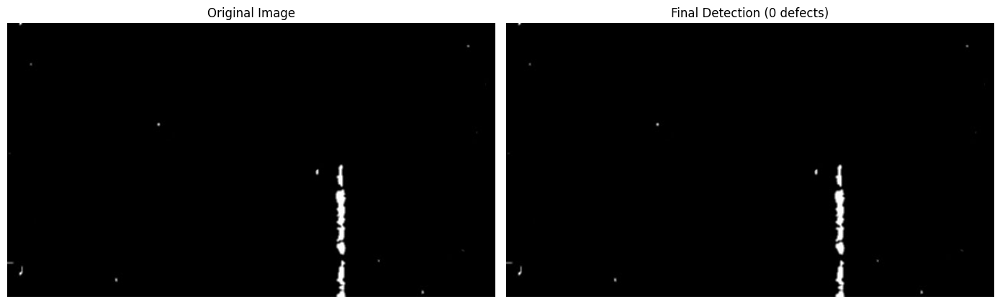


--- Processing 22_processed (2).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/22_processed (2).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 6 raw candidates. Merging...
  -> Final Defect Count: 0


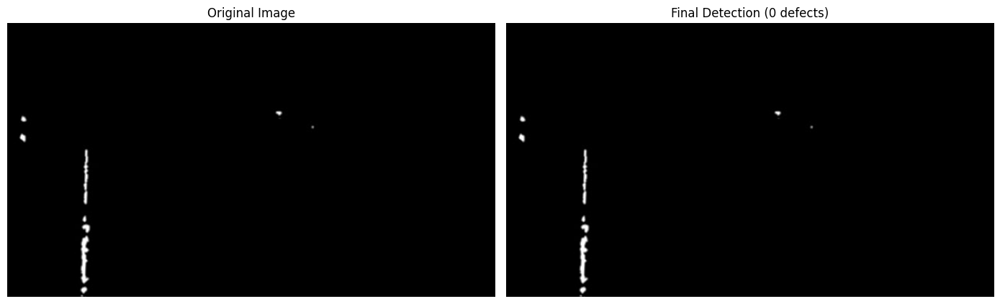


--- Processing 4_processed(2).jpg ---
Processing: /kaggle/input/fabric-defect-dataset/Data Set/verticle/4_processed(2).jpg
  -> Running GPU Gabor...
  -> Running GPU Background...
  -> Running GPU Statistical...
  -> Found 8 raw candidates. Merging...
  -> Final Defect Count: 1


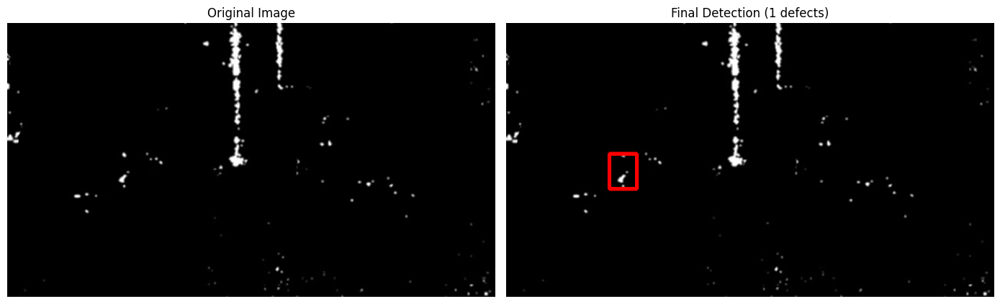

In [37]:
import os
import glob

# Path to your test images
folder_path = "/kaggle/input/fabric-defect-dataset/Data Set/verticle"
image_paths = glob.glob(os.path.join(folder_path, "*.jpg"))

print(f"Found {len(image_paths)} images.")

for img_path in image_paths[:15]:  # Test on first 15
    print(f"\n--- Processing {os.path.basename(img_path)} ---")
    final_boxes = run_all_classical_detectors(img_path)
    visualize_final_boxes(img_path, final_boxes) # Uncomment to see them one by one